In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as p
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import colors

from itertools import combinations
import scipy
from scipy.ndimage.filters import gaussian_filter1d
import sys
import os
import copy
atish_assay_path = 'fitness_assay_grantedits.py'
sys.path.append(os.path.dirname(os.path.expanduser(atish_assay_path)))
import fitness_assay_grantedits as atish

tools_path = '../code/tools.py'
sys.path.append(os.path.dirname(os.path.expanduser(tools_path)))
import tools

sns.set_style('white')
sns.set_style('ticks')
sns.set_color_codes()
from tools import mutant_colorset

In [2]:
name = 'merged+flaskswapcorrected_092519' 

merged_data = p.read_csv(f'../data/BarcodeCounts_{name}_withBCinfo.csv')

print(len(merged_data))

flask_swaps = {'Y1':'CC1','Z1':'DD1','CC1':'Y1','DD1':'Z1',
                'U1':'W1','V1':'X1','W1':'U1','X1':'V1'}

old_data = p.read_table(f'../data/Barcode_Counts_YupingProcess.tab')

merged_data = merged_data.merge(old_data,on='barcode',how='left')


print(len(merged_data))

remove_swaps = True

550
550


In [3]:
merged_data['barcode'].values

array([     53,     151,     262,     273,     323,     415,     499,
           622,     689,     697,    1185,    1322,    1379,    1488,
          1564,    1617,    1641,    1683,    1866,    2037,    2039,
          2288,    2468,    2608,    2768,    2776,    2808,    3160,
          3250,    3298,    3379,    3406,    3481,    3577,    3585,
          3675,    3730,    3920,    4418,    4691,    4791,    4949,
          5564,    5654,    5804,    6002,    6174,    6271,    6391,
          6582,    6672,    6814,    7269,    7291,    7375,    7423,
          7538,    7539,    7619,    7774,    7799,    7836,    7953,
          7961,    7994,    8009,    8297,    8459,    8825,    9293,
          9518,    9589,    9689,    9864,    9888,   10050,   10103,
         10307,   10316,   10623,   10794,   10848,   10851,   11056,
         11222,   11430,   11456,   11586,   11667,   11752,   11933,
         12090,   12752,   12757,   12785,   13029,   13132,   13183,
         13852,   13

In [4]:
merged_data[['barcode','A0','B0','C0','D0']]

loc = np.where(merged_data['barcode'].values==9000107)[0][0]

# merged_data['A0'].values/np.sum(merged_data['A0'].values)[loc]

In [8]:
col_set = ['Tneg','A0','A1','B0','B1','C0','C1','D0','D1']

counts = merged_data
counts = counts[~(counts['barcode'].isin([7777777,9999999]))]
counts = counts.sort_values('barcode')

for bc in spike_in_missense:
    if bc in counts['barcode'].values:
        loc = np.where(counts['barcode'].values==bc)[0][0]
        plt.plot([list(counts[col].values/np.sum(counts[col].values[:-1]))[loc] for col in col_set],color=tools.mutant_colorset['IRA1_missense'])
        
# for bc in spike_in_nonsense:
for bc in [9000101,9000104,9000105,9000106,9000107,9000109,9000110]:
    if bc == 9000107:
        loc = np.where(counts['barcode'].values==bc)[0][0]
        plt.plot([list(counts[col].values/np.sum(counts[col].values[:-1]))[loc] for col in col_set],color='orange')


    elif bc in counts['barcode'].values:
        loc = np.where(counts['barcode'].values==bc)[0][0]
        plt.plot([list(counts[col].values/np.sum(counts[col].values[:-1]))[loc] for col in col_set],color=tools.mutant_colorset['IRA1_nonsense'])
plt.yscale('log')
# loc = np.where(merged_data['barcode'].values==9000104)[0][0]
# plt.plot([list(merged_data[col].values/np.sum(merged_data[col].values))[loc] for col in col_set])

plt.xticks(range(len(col_set)),col_set)
# ,list(merged_data['B0'].values/np.sum(merged_data['B0'].values))[loc]

NameError: name 'spike_in_missense' is not defined

In [5]:
old_conditions = {
                  '3':['3.1','3.2','3.3'],
                  '6':['6.1','6.2','6.3'],
                  '13':['13.1','13.2','13.3'],
                  '18':['18.1','18.2','18.3'],
                  '20':['20.1','20.2','20.3'],
                  '21':['21.1','21.2','21.3'],
                  '23':['23.1','23.2','23.3']
                 }

old_conditions = {
                  '3':['t3.1','t3.2','t3.3'],
                  '6':['t6.1','t6.2','t6.3'],
                  '13':['t13.1','t13.2','t13.3'],
                  '18':['t18.1','t18.2','t18.3'],
                  '19':['t19.1','t19.2','t19.3'],
                  '20':['t20.1','t20.2','t20.3'],
                  '21':['t21.1','t21.2','t21.3'],
                  '23':['t23.1','t23.2','t23.3'],
                  'M3_Batch_3':['3.1','3.2','3.3'],
                  'M3_Batch_6':['6.1','6.2','6.3'],
                  'M3_Batch_13':['13.1','13.2','13.3'],
                  'M3_Batch_18':['18.1','18.2','18.3'],
#                   'M3_Batch_19':['t19.1','t19.2','t19.3'],
                  'M3_Batch_20':['20.1','20.2','20.3'],
                  'M3_Batch_21':['21.1','21.2','21.3'],
                  'M3_Batch_23':['23.1','23.2','23.3'],
                  'Ferm_44hr_Transfer':['t14.1','t14.2','t14.3'],
                  'Ferm_40hr_Transfer':['t15.1','t15.2','t15.3'],
                  'Ferm_54hr_Transfer':['t16.1','t16.2','t16.3'],
                  'Ferm_50hr_Transfer':['t17.1','t17.2','t17.3'],
                  'Resp_24hr_Transfer':['t5.1','t5.2','t5.3'],
                  'Resp_3Day_Transfer':['t7.1','t7.2','t7.3'],
                  'Resp_4Day_Transfer':['t8.1','t8.2'], # 8.3 has too little data
                  'Resp_5Day_Transfer':['t25.1','t25.2','t25.3'],
                  'Resp_6Day_Transfer':['t26.1','t26.2','t26.3'],
                  'Resp_7Day_Transfer':['t27.1','t27.2','t27.3'],
                  'DMSO':['t1.1','t1.2','t1.3'],
                  'Geldanamycin8.5uM':['t2.4','t2.5','t2.6'],
                    ## radicicol
                    ## benomyl
                    ## fluconazole
                    '1.4%':['1.4%-R1','1.4%-R2'],
                    '1.5%':['1.5%-R1','1.5%-R2'],
                    '1.6%':['1.6%-R1','1.6%-R2'],
                    '1.7%':['1.7%-R1','1.7%-R2'],
                    '1.8%':['1.8%-R1','1.8%-R2'],
                    '2.5%':['2.5%-R1','2.5%-R2'],  # not enough usable data
                    'Ben0.4':['Ben0.4-R1','Ben0.4-R2'], # not enough usable data
                    'Ben2':['Ben2-R1','Ben2-R2'], # not enough usable data
#                     'Ben10':['Ben10-R1','Ben10-R2'],
    
    }

bigbatch_conditions = {
                        '1BB_M3':['A','B','C','D'],
                        '1BB_Baffle':['E','F'],
                        '1BB_1.4%Gluc' :['G','H'],
                        '1BB_1.8%Gluc' :['I','J'],
                        '1BB_0.2MNaCl' :['K','L'],
#                         '1BB_0.2MNaCl' :['K'], 
                        '1BB_0.5MNaCl' :['M','N'],
                        '1BB_0.2MKCl' :['O'],
                        '1BB_0.5MKCl' :['P'],
                        '1BB_8.5uMGdA' :['Q','R'],
                        '1BB_17uMGdA' :['S','T'],
                        '1BB_2ugFlu' :['U','V'],
                        '1BB_0.5ugFlu' :['W','X'],
                        '1BB_1%Raf' :['Y','Z'],
                        '1BB_0.5%Raf' :['AA','BB'],
                        '1BB_1%Gly' :['CC','DD'],
                        '1BB_1%EtOH' :['EE','FF'],
                        '1BB_SucRaf' :['GG'],
                      }



conditions = {**old_conditions, **bigbatch_conditions}

just_reps = [rep for reps in conditions.values() for rep in reps]

In [6]:
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

# neutrals = full_neutral_list
neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))


## SECOND PASS
# neutrals = fitness_df[fitness_df['mutation_type'].isin(['ExpNeutral','other'])]['barcode'].values

In [ ]:
{col:np.count_nonzero(merged_data[col]) for col in merged_data.columns}

(-0.001, 0.02)

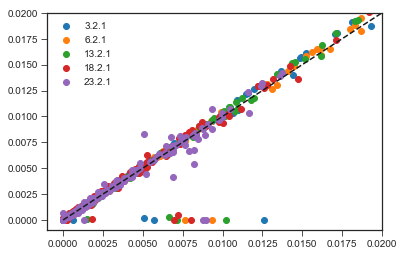

In [8]:
data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]
data = data.sort_values('barcode')

samples = ['3.1.1','6.1.1','13.1.1','18.1.1','23.1.1']
samples = ['3.2.1','6.2.1','13.2.1','18.2.1','23.2.1']
for sample in samples:


    plt.scatter(data[f't{sample}']/np.nansum(data[f't{sample}']),
                data[f'{sample.replace(".","-")}']/np.nansum(data[f'{sample.replace(".","-")}']),label=sample)
plt.plot([0,0.1],[0,0.1],'k--')
plt.legend()
plt.xlim(-0.001,0.02)
plt.ylim(-0.001,0.02)

In [9]:
column_counts = {col:np.count_nonzero(merged_data[col]) for col in merged_data.columns}

cutoff = 400

sparse_samples = []

for sample,count in column_counts.items():
    if count < 400:
        sparse_samples.append(sample)
        
print(sparse_samples)
        

['21+wt', '6-1-3', '6-2-2', 'Ben10-R1-T2', 'Ben10-R1-T4', 'Ben10-R2-T1', 'Ben10-T0', 'Ben2-R1-T3', 'L2', 'N2', 'N3', 'N4', 'T4', 'X1', 't6.1.3', 't6.2.2', 't16.0.x', 't16.0.pool.x', 't16.0.y', 't16.0.pool.y', 't16.4.1.y', 't16.4.3.y', 't17.3.3.y', 't17.4.1.y', 't17.4.2.y']


In [10]:
data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]
data = data.sort_values('barcode')

data[data['barcode'].isin([13183])][['F0','F1','F2']].values
np.sum(data[['F0','F1','F2']],axis=0)

# merged_data['F']

F0    1569404.0
F1    5377130.0
F2    4003213.0
dtype: float64

In [11]:
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))

len(neutrals)

35

Run this cell, along with the mutation assigning cell below, twice. The first time, commenting out the "second pass" line. This allows to first run inference using a set of highly-confident neutral lineages to filter out not sequenced mutations that are not neutral. Then, we conduct a second pass where we allow all lineages that were similar to this highly confident set to be used as neutral lineages.

In [14]:
remove_swaps = True
weighted = True
save_output = True

data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]
data = data.sort_values('barcode')
data = data.drop(columns=sparse_samples) # sparse timepoints resulting a lot of missing data
for col in sparse_samples:
    data[col] = np.zeros(len(data.index))
if remove_swaps:
    data = data.drop(columns=[col for col in flask_swaps.keys() if col not in sparse_samples]) # sparse timepoints resulting a lot of missing data
    for col in [col for col in flask_swaps.keys() if col not in sparse_samples]:
        data[col] = np.zeros(len(data.index))
data = data.fillna(0)

# save_for_later_reps = ['A','B','C','D','3.1','13.1','18.1']
save_for_later_dict = {}

cov_thresh = 1000

### called neutral by atish's method in ALL 5000 bc experiments
### [could also be below some set threshold across all experiments]
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))

## SECOND PASS
neutrals = fitness_df[fitness_df['mutation_type'].isin(['ExpNeutral','other'])]['barcode'].values

neutrals = [bc for bc in data['barcode'].values if bc in neutrals]




print(neutrals)

fitnesses = {}

other_info = ['barcode','gene','type','ploidy','class','additional_muts']

for condition,replicates in conditions.items():
    print(condition)
    print(replicates)
    rep_times = {}
    r_timepoints = []
    for rep in replicates:
        
        these_times = []
        timepoints = []
        if condition in old_conditions.keys():
            
            if '%' in rep or 'Ben' in rep:
                e,r = rep.split('-')
                if e+'-T0' in data.columns:
                    these_times.append(e+'-T0')
                    timepoints.append(0)

                for i in range(1,5):
                    if rep+'-T'+str(i) in data.columns:
                        these_times.append(rep+'-T'+str(i))
                        timepoints.append(i)
            
            else:

                e,r = rep.split('.')
    #             if e in ['13','15']:
    #                 timepoints.append(0)
    #                 these_times.append('13-0_pool')
    #             else:
    #                 if e+'-0' in data.columns:
    #                     timepoints.append(0)
    #                     these_times.append(e+'-0')
                if e in ['t16','t17']:
                    for t in range(1,5):
                        if e+'.'+str(t)+'.'+r+'.x' in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'.'+str(t)+'.'+r+'.x')

                elif 't' in e:
                    for t in range(1,5):
                        if e+'.'+str(t)+'.'+r in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'.'+str(t)+'.'+r)
                else:
                    for t in range(1,5):
                        if e+'-'+str(t)+'-'+r in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'-'+str(t)+'-'+r)
                

        if condition in bigbatch_conditions.keys():
            for i in range(5):
                if rep+str(i) in data.columns:
                    these_times.append(rep+str(i))
                    timepoints.append(i)
                    
        r_timepoints.append(timepoints)
        
        rep_times[rep] = data[these_times].values
        print(timepoints)
        print(r_timepoints)
        print(rep)
    print({rep:np.nansum(rep_times[rep],axis=0) for rep in rep_times.keys()})
    print(rep_times)
#     answer = atish.inferFitness(data['barcode'].values,timepoints,rep_times,
#                                 neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,useMultNoise=True,weightedMean=weighted)
    answer = atish.inferFitness(data['barcode'].values,timepoints,rep_times,
                                neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=True,useMultNoise=True,weightedMean=weighted)
    answer = atish.inferFitness(data['barcode'].values,timepoints,rep_times,
                                neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=False,useMultNoise=True,weightedMean=weighted)
    for rep in replicates:
#         if rep in save_for_later_reps:
        save_for_later_dict[rep] = answer[rep]

    for rep in replicates:

        fitnesses[rep+'_fitness'] = answer[rep]['aveFitness']
        fitnesses[rep+'_error'] = answer[rep]['aveError']

for other_setting in other_info:
    if other_setting in data.columns:
        fitnesses[other_setting] = data[other_setting].values

fitness_df = p.DataFrame(fitnesses)
fitness_df = fitness_df.replace([np.inf, -np.inf], np.nan)
# fitness_df = fitness_df.replace([float('Inf'),-float('Inf'),np.inf, -np.inf], np.nan)

for condition,replicates in conditions.items():
    
    
    fitness_df[condition+'_fitness'] = np.nansum([fitness_df[rep+'_fitness'].values/fitness_df[rep+'_error'].values for rep in replicates],axis=0) \
    /np.nansum([1.0/fitness_df[rep+'_error'].values for rep in replicates],axis=0)
    
    fitness_df[condition+'_error'] = np.nansum([1.0/fitness_df[rep+'_error'].values for rep in replicates],axis=0)**(-1)


    
fitness_df = fitness_df[other_info+[col for col in fitness_df if col not in other_info]]

# if save_output:
#     if weighted:
#         if not remove_swaps:
#             fitness_df.to_csv('../data/fitness_weighted_allconditions.csv',index=False)
#         else:
#             fitness_df.to_csv('../data/fitness_weighted_allconditions_swapsremoved.csv',index=False)

#     else:
#         if not remove_swaps:
#             fitness_df.to_csv('../data/fitness_unweighted_allconditions.csv',index=False)
#         else:
#             fitness_df.to_csv('../data/fitness_unweighted_allconditions_swapsremoved.csv',index=False)


[1641, 1683, 7291, 8825, 10307, 13183, 17499, 17615, 19894, 20632, 24151, 24362, 26612, 29375, 34189, 39066, 39633, 41601, 42040, 45031, 45512, 49174, 53054, 54461, 58107, 60333, 60549, 64731, 70033, 70408, 71926, 72008, 72395, 72939, 73802, 74280, 77609, 79953, 84997, 88494, 99005, 104349, 105497, 107286, 107751, 107971, 109476, 112427, 113483, 117630, 119403, 120600, 121650, 122302, 132805, 134852, 142054, 143026, 143344, 151541, 164627, 171083, 195473, 195887, 205157, 208465, 225103, 230962, 238413, 239769, 241857, 247616, 263665, 270104, 276407, 277185, 287352, 294706, 298344, 303501, 316048, 316954, 330943, 334616, 352078, 352705, 371306, 419648, 430247, 454851]
3
['t3.1', 't3.2', 't3.3']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t3.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t3.2
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4], [1, 2, 3, 4]]
t3.3
{'t3.1': array([1351750., 2135554., 1618035., 3250337.]), 't3.2': array([1933347., 2417818., 3119308., 2877315.]), 't3.3': array([1283986., 2070974., 246995

/Users/grantkinsler/Documents/Stanford/Research/1BigBatchPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/1BigBatchPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/1BigBatchPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/1BigBatchPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/1BigBatchPaper

Multiplicative noise consistency checks

t6.1  inconsistent times:

kappas [2.26366022 2.62322174 1.7989382 ]
multNoise [0.17843797 0.17843797 0.17843797]
No clear inconsistencies


t6.2  inconsistent times:

kappas [4.17885835 1.75951403]
multNoise [0.17843797 0.17843797]
No clear inconsistencies


t6.3  inconsistent times:

kappas [2.60650621 1.66541403]
multNoise [0.17843797 0.17843797]
No clear inconsistencies

13
['t13.1', 't13.2', 't13.3']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t13.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t13.2
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4], [1, 2, 3, 4]]
t13.3
{'t13.1': array([ 644454., 1358757., 2257852.,  866883.]), 't13.2': array([ 737543.,  972456., 1877262.,  970611.]), 't13.3': array([ 636579.,  218376., 1683329.,  605722.])}
{'t13.1': array([[2.80000e+02, 3.19000e+02, 1.76000e+02, 3.10000e+01],
       [2.36610e+04, 8.71710e+04, 2.17481e+05, 1.24628e+05],
       [1.59500e+03, 1.40900e+03, 8.24000e+02, 1.18000e+02],
       ...,
       [0.00000e+00, 0.000

Multiplicative noise consistency checks

t19.1  inconsistent times:

kappas [2.40212617 2.83827664 1.4525571 ]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies


t19.2  inconsistent times:

kappas [2.13144758 1.94446769 2.84961856]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies


t19.3  inconsistent times:

kappas [1.71733472 1.56117068 2.80152517]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies

20
['t20.1', 't20.2', 't20.3']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t20.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t20.2
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4], [1, 2, 3, 4]]
t20.3
{'t20.1': array([ 307255., 1250628., 1089708.,  698235.]), 't20.2': array([1000502., 1275604.,  955884., 1226901.]), 't20.3': array([1129711., 1004777.,  930511., 1276530.])}
{'t20.1': array([[  555.,  2059.,  1387.,   696.],
       [ 4183., 19716., 28903., 27291.],
       [  427.,  1673.,  1027.,   408.],
       ...,
       [    0.,     0.,     0.,     0.]

neutral reads 23200.0 9685.0
neutral reads 41003.0 21178.0
neutral reads 21178.0 10876.0
neutral reads 10876.0 1957.0
neutral reads 40489.0 6264.0
neutral reads 6264.0 25152.0
neutral reads 25152.0 7141.0
neutral reads 37541.0 5261.0
neutral reads 5261.0 11712.0
neutral reads 11712.0 2177.0
Multiplicative noise consistency checks

13.1  inconsistent times:

kappas [4.79106226 4.27708873 3.25881436]
multNoise [0.10038618 0.12688153 0.08983962]
No clear inconsistencies


13.2  inconsistent times:

kappas [5.59729413 3.45942689 2.02800638]
multNoise [0.10038618 0.12688153 0.08983962]
No clear inconsistencies


13.3  inconsistent times:

kappas [2.65446089 8.73895425 2.00647307]
multNoise [0.10038618 0.12688153 0.08983962]
No clear inconsistencies

Multiplicative noise consistency checks

13.1  inconsistent times:

kappas [4.40592318 4.28112867 3.41061068]
multNoise [0.10038618 0.12688153 0.08983962]
No clear inconsistencies


13.2  inconsistent times:

kappas [5.49471807 3.71804697 2.1531

neutral reads 106455.0 72595.0
neutral reads 72595.0 32662.0
neutral reads 32662.0 18246.0
neutral reads 105434.0 71995.0
neutral reads 71995.0 32612.0
neutral reads 32612.0 18044.0
neutral reads 126924.0 89292.0
neutral reads 89292.0 48934.0
neutral reads 48934.0 25175.0
neutral reads 120142.0 84281.0
neutral reads 84281.0 45774.0
neutral reads 45774.0 23373.0
neutral reads 111986.0 95570.0
neutral reads 95570.0 41408.0
neutral reads 41408.0 24838.0
neutral reads 107447.0 91876.0
neutral reads 91876.0 39787.0
neutral reads 39787.0 23697.0
Multiplicative noise consistency checks

23.1  inconsistent times:

kappas [15.78889591 23.19329598 21.53837842]
multNoise [0.1111914  0.22360996 0.19588799]
No clear inconsistencies


23.2  inconsistent times:

kappas [7.33022697 8.80278249 1.83472118]
multNoise [0.1111914  0.22360996 0.19588799]
No clear inconsistencies


23.3  inconsistent times:

kappas [12.34076562  3.87285505  4.84724823]
multNoise [0.1111914  0.22360996 0.19588799]
No clear in

kappas [ 9.02693166  1.88530392 13.22588055]
multNoise [0.1936267  0.28003535 0.11325688]
No clear inconsistencies


t16.3  inconsistent times:

kappas [31.51591363  7.28277027  5.29740976]
multNoise [0.1936267  0.28003535 0.11325688]
No clear inconsistencies

Ferm_50hr_Transfer
['t17.1', 't17.2', 't17.3']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t17.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t17.2
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4], [1, 2, 3, 4]]
t17.3
{'t17.1': array([ 268263.,  261034., 1333273., 8263162.]), 't17.2': array([ 225918.,  130679.,  572048., 4064737.]), 't17.3': array([ 209260.,  648023., 2548539., 8313678.])}
{'t17.1': array([[1.370000e+02, 6.600000e+01, 1.810000e+02, 5.040000e+02],
       [9.194000e+03, 1.481300e+04, 1.254660e+05, 1.303024e+06],
       [6.810000e+02, 2.380000e+02, 5.700000e+02, 1.602000e+03],
       ...,
       [0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00],
       [0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00],
       [0.000000e+00, 0.00

Multiplicative noise consistency checks

t7.1  inconsistent times:

kappas [1.82595613 2.50146336 1.54507472]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies


t7.2  inconsistent times:

kappas [2.17281288 2.06740788 1.6895976 ]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies


t7.3  inconsistent times:

kappas [4.60961273 2.03354977 1.39533487]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies

Resp_4Day_Transfer
['t8.1', 't8.2']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t8.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t8.2
{'t8.1': array([ 440152.,  808521., 1158276., 1178825.]), 't8.2': array([ 607694.,  811584., 1966072., 1156711.])}
{'t8.1': array([[2.90000e+01, 1.90000e+01, 2.60000e+01, 1.10000e+01],
       [3.42540e+04, 8.74720e+04, 1.86869e+05, 2.71475e+05],
       [1.31000e+02, 1.00000e+02, 6.90000e+01, 3.20000e+01],
       ...,
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00],
       [0.00000e+00, 0.00000e+00, 0.00000

Multiplicative noise consistency checks

t27.1  inconsistent times:

kappas [ 3.56386776  3.75684707 21.03601654]
multNoise [0.44765376 0.43859026 1.12390798]
No clear inconsistencies


t27.2  inconsistent times:

kappas [12.3296605   5.57694298  4.81875431]
multNoise [0.44765376 0.43859026 1.12390798]
No clear inconsistencies


t27.3  inconsistent times:

kappas [ 5.45931758 17.71378281  9.77848068]
multNoise [0.44765376 0.43859026 1.12390798]
No clear inconsistencies

DMSO
['t1.1', 't1.2', 't1.3']
[1, 2, 3, 4]
[[1, 2, 3, 4]]
t1.1
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4]]
t1.2
[1, 2, 3, 4]
[[1, 2, 3, 4], [1, 2, 3, 4], [1, 2, 3, 4]]
t1.3
{'t1.1': array([ 749158., 1163800., 2060792.,  381226.]), 't1.2': array([1096103., 1435828., 2211172., 1424225.]), 't1.3': array([ 712852., 1138516., 2015201., 2653519.])}
{'t1.1': array([[2.57000e+02, 1.67000e+02, 2.91000e+02, 2.70000e+01],
       [3.87430e+04, 7.36460e+04, 1.61456e+05, 3.27450e+04],
       [1.19400e+03, 6.99000e+02, 8.84000e+02, 9.40

neutral reads 1444.0 835.0
neutral reads 835.0 859.0
neutral reads 3268.0 1924.0
neutral reads 1924.0 1235.0
neutral reads 1235.0 595.0
neutral reads 595.0 381.0
neutral reads 3387.0 1850.0
neutral reads 1850.0 1748.0
neutral reads 1748.0 1000.0
neutral reads 1000.0 912.0
neutral reads 3292.0 1777.0
neutral reads 1777.0 1600.0
neutral reads 1600.0 837.0
neutral reads 837.0 610.0
Multiplicative noise consistency checks

1.5%-R1  inconsistent times:

kappas [1.86232929 1.77109417 1.6125868  1.65403492]
multNoise [0.1        0.1        0.05081175 0.04782412]
No clear inconsistencies


1.5%-R2  inconsistent times:

kappas [1.87812322 1.87560187 1.25209047 2.00828233]
multNoise [0.1        0.1        0.05081175 0.04782412]
No clear inconsistencies

Multiplicative noise consistency checks

1.5%-R1  inconsistent times:

kappas [1.87500305 1.81805346 1.6125868  1.65403492]
multNoise [0.1        0.1        0.05081175 0.04782412]
No clear inconsistencies


1.5%-R2  inconsistent times:

kappas [1

multNoise [0.1 0.1 0.1 0.1]
No clear inconsistencies

Multiplicative noise consistency checks

2.5%-R1  inconsistent times:

kappas [2.02939054 1.51566452 1.67606208 2.31652959]
multNoise [0.1 0.1 0.1 0.1]
No clear inconsistencies


2.5%-R2  inconsistent times:

kappas [0.98429543 1.99304218 1.34473685 3.67786187]
multNoise [0.1 0.1 0.1 0.1]
No clear inconsistencies

Ben0.4
['Ben0.4-R1', 'Ben0.4-R2']
[0, 1, 2, 3, 4]
[[0, 1, 2, 3, 4]]
Ben0.4-R1
[0, 1, 2, 3, 4]
[[0, 1, 2, 3, 4], [0, 1, 2, 3, 4]]
Ben0.4-R2
{'Ben0.4-R1': array([ 8572., 13677., 12713., 16821., 25124.]), 'Ben0.4-R2': array([ 8572., 16581., 13224., 14369., 22639.])}
{'Ben0.4-R1': array([[ 15.,  25.,  21.,  29.,  42.],
       [ 69.,  39.,  15.,  14.,  30.],
       [ 32.,  67.,  65.,  65., 101.],
       ...,
       [  0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.],
       [  0.,   0.,   0.,   0.,   0.]]), 'Ben0.4-R2': array([[15., 34., 22., 32., 45.],
       [69., 41., 23., 13., 33.],
       [32., 80., 67., 

neutral reads 186038.0 322471.0
neutral reads 322471.0 51904.0
neutral reads 51904.0 10689.0
neutral reads 10689.0 37016.0
neutral reads 176678.0 303368.0
neutral reads 303368.0 48466.0
neutral reads 48466.0 9928.0
neutral reads 9928.0 33749.0
neutral reads 140911.0 328454.0
neutral reads 328454.0 139319.0
neutral reads 139319.0 174751.0
neutral reads 174751.0 77071.0
neutral reads 134370.0 313971.0
neutral reads 313971.0 132841.0
neutral reads 132841.0 165604.0
neutral reads 165604.0 72575.0
Multiplicative noise consistency checks

E  inconsistent times:

kappas [43.93943208  6.93417283  2.81192313  8.8058127 ]
multNoise [0.05413834 0.10708853 0.09969661 0.08656245]
No clear inconsistencies


F  inconsistent times:

kappas [45.46064586  5.228292   10.03901847  2.91759989]
multNoise [0.05413834 0.10708853 0.09969661 0.08656245]
No clear inconsistencies

Multiplicative noise consistency checks

E  inconsistent times:

kappas [55.24335844  7.34284222  2.77198069  9.07182333]
multNoise [0

neutral reads 150584.0 628353.0
neutral reads 628353.0 554009.0
neutral reads 554009.0 46904.0
neutral reads 46904.0 25472.0
neutral reads 143281.0 603550.0
neutral reads 603550.0 531217.0
neutral reads 531217.0 44982.0
neutral reads 44982.0 24112.0
neutral reads 319533.0 582515.0
neutral reads 316683.0 580020.0
Multiplicative noise consistency checks

M  inconsistent times:

kappas [60.93472824 79.03611071 10.01838605  5.42038747]
multNoise [0.32603857 0.32603857 0.32603857 0.32603857]
No clear inconsistencies


N  inconsistent times:

kappas [69.57507158]
multNoise [0.32603857]
No clear inconsistencies

Multiplicative noise consistency checks

M  inconsistent times:

kappas [63.24759789 78.88254948 10.34852745  5.889305  ]
multNoise [0.32603857 0.32603857 0.32603857 0.32603857]
No clear inconsistencies


N  inconsistent times:

kappas [64.33774153]
multNoise [0.32603857]
No clear inconsistencies

1BB_0.2MKCl
['O']
[0, 1, 2, 3, 4]
[[0, 1, 2, 3, 4]]
O
{'O': array([4797683., 2930326., 2

Multiplicative noise consistency checks

W  inconsistent times:

kappas [9.07474803 6.73523296 4.83472907]
multNoise [0.19721888 0.09990405 0.13885099]
No clear inconsistencies


X  inconsistent times:

kappas [ 11.25742269 174.57775044   5.32575611]
multNoise [0.19721888 0.09990405 0.13885099]
No clear inconsistencies

1BB_1%Raf
['Y', 'Z']
[0, 1, 2, 3, 4]
[[0, 1, 2, 3, 4]]
Y
[0, 1, 2, 3, 4]
[[0, 1, 2, 3, 4], [0, 1, 2, 3, 4]]
Z
{'Y': array([  997018.,        0., 17161782., 13717665.,  5754673.]), 'Z': array([ 419253.,       0., 1073907.,   54780., 1556404.])}
{'Y': array([[1.125000e+03, 0.000000e+00, 5.496000e+03, 2.243000e+03,
        7.860000e+02],
       [3.369600e+04, 0.000000e+00, 1.073318e+06, 1.056267e+06,
        5.621720e+05],
       [7.430000e+02, 0.000000e+00, 3.214000e+03, 1.366000e+03,
        4.130000e+02],
       ...,
       [0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00],
       [6.330000e+02, 0.000000e+00, 2.161600e+04, 1.807300e+04,
    

neutral reads 416291.0 419248.0
neutral reads 419248.0 44074.0
neutral reads 44074.0 12054.0
neutral reads 228874.0 391096.0
neutral reads 391096.0 389805.0
neutral reads 389805.0 40671.0
neutral reads 40671.0 10743.0
Multiplicative noise consistency checks

EE  inconsistent times:

kappas [31.59011486 13.80371642  4.2527557   1.5518362 ]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies


FF  inconsistent times:

kappas [36.37556733 77.16197193  7.89388597  5.23782199]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies

Multiplicative noise consistency checks

EE  inconsistent times:

kappas [32.48218525 13.83390589  4.09296737  1.66113038]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies


FF  inconsistent times:

kappas [46.82638606 82.9422177   8.14253014  6.13705078]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies

1BB_SucRaf
['GG']
[0, 1, 2, 3, 4]
[[0, 1, 

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:143: RuntimeWarning: divide by zero encountered in reciprocal


In [15]:
## Add some additional information about mutation type

diploid_mean = np.mean(fitness_df[fitness_df['gene']=='Diploid']['1BB_M3_fitness'])
diploid_std = np.std(fitness_df[fitness_df['gene']=='Diploid']['1BB_M3_fitness'])

m3_conditions = ['19',
                'M3_Batch_3',
                'M3_Batch_6',
                'M3_Batch_13',
                'M3_Batch_18',
                'M3_Batch_20',
                'M3_Batch_21',
                'M3_Batch_23',
                '1BB_M3']

### Identify Other and NotSequenced that are likely adaptive (their 3 sigma lower bound is > 0 in at least 5 M3 conditions)
multiplier = 3
count_thresh = 5

candidate_set = fitness_df[fitness_df['gene']=='other']

upper = candidate_set[[col+'_fitness' for col in m3_conditions]].values + multiplier*candidate_set[[col+'_error' for col in m3_conditions]].values
lower = candidate_set[[col+'_fitness' for col in m3_conditions]].values - multiplier*candidate_set[[col+'_error' for col in m3_conditions]].values

locs,counts = np.unique(np.where(lower > 0 )[0],return_counts=True)
adaptive_locs = locs[np.where(counts>count_thresh)[0]]
other_adaptive_bcs = candidate_set['barcode'].values[adaptive_locs]

candidate_set = fitness_df[fitness_df['gene']=='NotSequenced']

upper = candidate_set[[col+'_fitness' for col in m3_conditions]].values + multiplier*candidate_set[[col+'_error' for col in m3_conditions]].values
lower = candidate_set[[col+'_fitness' for col in m3_conditions]].values - multiplier*candidate_set[[col+'_error' for col in m3_conditions]].values

locs,counts = np.unique(np.where(lower > 0 )[0],return_counts=True)
adaptive_locs = locs[np.where(counts>count_thresh)[0]]
notsequenced_adaptive_bcs = candidate_set['barcode'].values[adaptive_locs]

mutation_type = []
for entry in range(len(fitness_df.index)):
    gene_name = fitness_df['gene'].values[entry]
    this_type = fitness_df['type'].values[entry]
    this_bc = fitness_df['barcode'].values[entry]
    this_class = fitness_df['class'].values[entry]
    m3_fitness = fitness_df['1BB_M3_fitness'].values[entry]
    if gene_name == 'IRA1':
        if this_type == 'missense_variant':
            mutation_type.append('IRA1_missense')
        elif this_type in ['frameshift_variant','stop_gained']:
            mutation_type.append('IRA1_nonsense')
        else:
            mutation_type.append('IRA1_other')
    elif gene_name == 'Diploid':
        if m3_fitness > diploid_mean+2*diploid_std:
            mutation_type.append('Diploid_adaptive')
        else:
            mutation_type.append('Diploid')
            
    elif this_bc in other_adaptive_bcs:
        mutation_type.append('other_adaptive')
        
    elif this_bc in notsequenced_adaptive_bcs:
        mutation_type.append('NotSequenced_adaptive')
        
    elif this_class == 'ExpNeutral':
        mutation_type.append('ExpNeutral')
        
    else:
        mutation_type.append(gene_name)
            
fitness_df['mutation_type'] = mutation_type


# if save_output:
#     if weighted:
#         if not remove_swaps:
#             fitness_df.to_csv('../data/fitness_weighted_allconditions.csv',index=False)
#         else:
#             fitness_df.to_csv('../data/fitness_weighted_allconditions_swapsremoved_neutral2xpass.csv',index=False)

#     else:
#         if not remove_swaps:
#             fitness_df.to_csv('../data/fitness_unweighted_allconditions.csv',index=False)
#         else:
#             fitness_df.to_csv('../data/fitness_unweighted_allconditions_swapsremoved.csv',index=False)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in greater
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in greater


In [38]:
save_for_later_dict['A']

{'allTimeErrors': array([[0.16318825, 0.13914969, 0.16286734, 0.13744298],
        [0.15265302, 0.13249607, 0.14660238, 0.11614673],
        [0.1660743 , 0.14047592, 0.16438105, 0.14322372],
        ...,
        [       nan,        nan,        nan,        nan],
        [0.16707335, 0.13750961, 0.15632184, 0.1232385 ],
        [0.15519672, 0.13343986, 0.14791981, 0.11706037]]),
 'allTimeFitness': array([[0.12297967, 0.3391074 , 0.301326  , 0.33883381],
        [0.47092204, 0.97453776, 1.07534753, 0.78325239],
        [0.10025348, 0.39873408, 0.39153297, 0.17054116],
        ...,
        [       nan,        nan,        nan,        nan],
        [0.68563403, 0.9372646 , 0.54866831, 0.95358652],
        [0.63735717, 0.86543776, 0.90196726, 0.97915433]]),
 'aveError': array([0.07457029, 0.06733843, 0.07609677, 0.06765416, 0.06810201,
        0.06749979,        inf, 0.07823749, 0.06816422, 0.07803362,
               inf,        inf, 0.06734441, 0.06756767, 0.07991076,
        0.06774697, 0.0

In [95]:
output['multNoiseParams']

array([0.1522296 , 0.13235833, 0.14644423, 0.11600985])

In [49]:
def gaussian(x,mu,var):
    return 1.0/np.sqrt(2*np.pi*var)*np.exp(-(x-mu)**2/(2*var))

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


3.0555627251069097
9.336463567062765
[0.11285201 0.11902568 0.10235688]
2.011871970879145
9.336463567062765
[0.11285201 0.11902568 0.10235688]
1.8467838734978537
3.410610675411736
[0.10038618 0.12688153 0.08983962]
1.3556553320197822
3.410610675411736
[0.10038618 0.12688153 0.08983962]
2.348651436582197
5.516163570559617
[0.2084194  0.14661821 0.08880539]
3.374399094465206
5.516163570559617
[0.2084194  0.14661821 0.08880539]
3.4159263360376664
11.668552733235718
[0.1522296  0.13235833 0.14644423 0.11600985]
5.376445331361853
11.668552733235718
[0.1522296  0.13235833 0.14644423 0.11600985]
3.9908540766046863
15.926916260752243
[0.1522296  0.13235833 0.14644423 0.11600985]
14.278307220935957
15.926916260752243
[0.1522296  0.13235833 0.14644423 0.11600985]
4.209281915044788
17.718054240323116
[0.1522296  0.13235833 0.14644423 0.11600985]
12.079055425186494
17.718054240323116
[0.1522296  0.13235833 0.14644423 0.11600985]
1.9375720240111451
3.7541853482306458
[0.1522296  0.13235833 0.146444

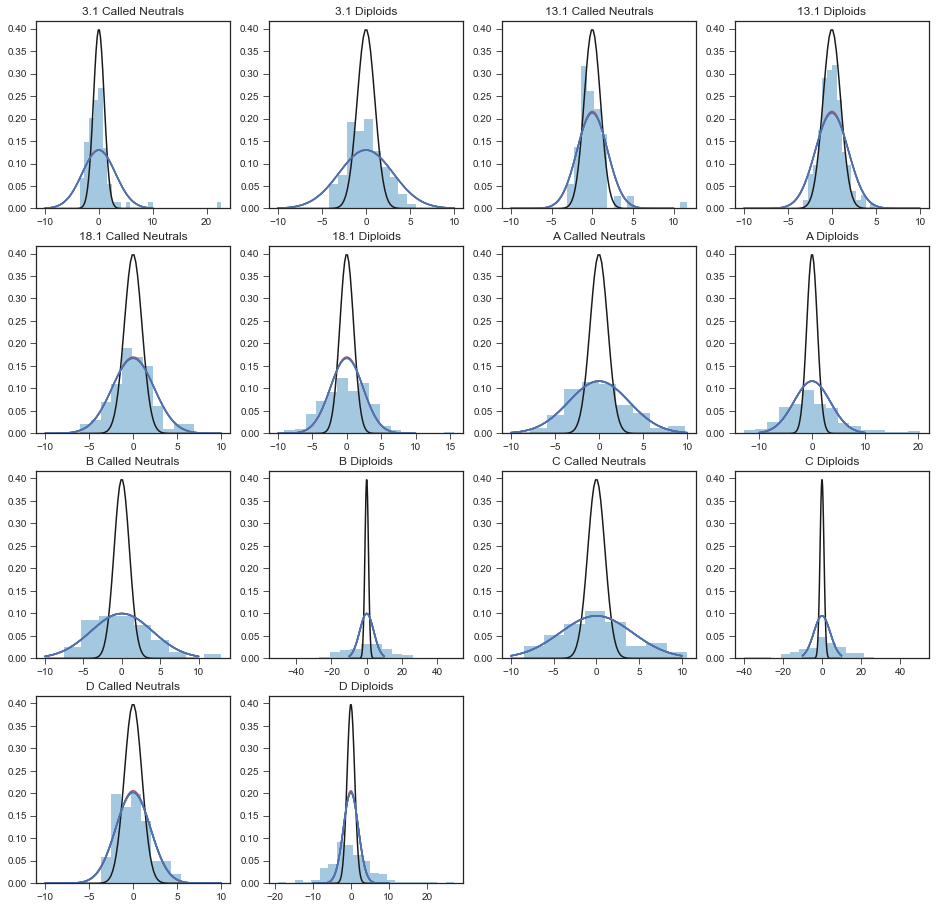

In [98]:
spike_in_missense = [9000000 + i for i in range(11)]
spike_in_nonsense = [9000100 + i for i in range(11)]

diploid_bcs = fitness_df[fitness_df['mutation_type']=='Diploid']['barcode'].values

plt.figure(figsize=(4*4,4*5))
for r,(rep,output) in enumerate(save_for_later_dict.items()):
    
    comparison_sets = [output['neutralBarcodes'],diploid_bcs]
    comparison_names = ['Called Neutrals','Diploids']
    for c,c_set in enumerate(comparison_sets):
        plt.subplot(5,4,r*len(comparison_sets)+c+1)

        set_locs = np.where(np.isin(output['barcodes'],c_set))[0]
    #     diploid_locs = np.where(np.isin(output['barcodes'],output['neutralBarcodes']))[0]
        if np.sum(~np.isnan(output['zScores'][set_locs])) > 5:
            sns.distplot(output['zScores'][set_locs]-np.mean(output['zScores'][set_locs]),kde=False,norm_hist=True)
            xs = np.linspace(-10,10,100)
            print(np.std(output['zScores'][set_locs]-np.mean(output['zScores'][set_locs])))
            print(output['kappas'][-1])
            print(output['multNoiseParams'])
            plt.plot(xs,[gaussian(x,0,output['kappas'][-1]) for x in xs],color='r')
            plt.plot(xs,[gaussian(x,0,1) for x in xs],color='k') 
            plt.plot(xs,[gaussian(x,0,output['kappas'][-1]+output['multNoiseParams']*) for x in xs],color='b')

            plt.title(f"{rep} {comparison_names[c]}")
    

# save_for_later_dict['A']

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


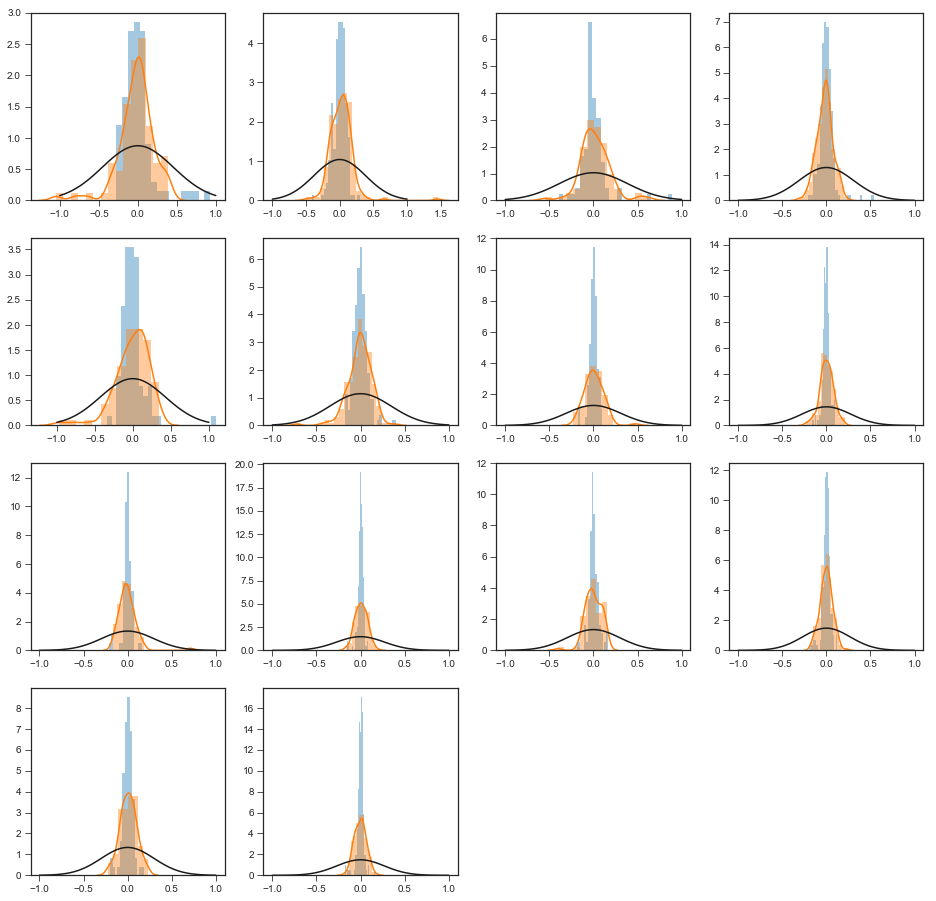

In [110]:
diploid_bcs = fitness_df[fitness_df['mutation_type']=='Diploid']['barcode'].values

plt.figure(figsize=(4*4,4*5))
for r,(rep,output) in enumerate(save_for_later_dict.items()):
    
    comparison_sets = [output['neutralBarcodes'],diploid_bcs]
    comparison_names = ['Called Neutrals','Diploids']
    for c,c_set in enumerate(comparison_sets):
        plt.subplot(5,4,r*len(comparison_sets)+c+1)

        set_locs = np.where(np.isin(output['barcodes'],c_set))[0]
    #     diploid_locs = np.where(np.isin(output['barcodes'],output['neutralBarcodes']))[0]
        if np.sum(~np.isnan(output['zScores'][set_locs])) > 5:
            sns.distplot(output['aveFitness'][set_locs]-np.mean(output['aveFitness'][set_locs]),kde=False,norm_hist=True)
            xs = np.linspace(-1,1,100)
            sns.distplot(np.random.normal(0,output['aveError'][set_locs]))
            plt.plot(xs,[gaussian(x,0,np.mean(output['aveError'][set_locs])) for x in xs],color='k') 
#             
#             print(np.std(output['zScores'][set_locs]-np.mean(output['zScores'][set_locs])))
#             print(output['kappas'][-1])
#             print(output['multNoiseParams'])
#             plt.plot(xs,[gaussian(x,0,output['kappas'][-1]) for x in xs],color='r')
#             plt.plot(xs,[gaussian(x,0,1) for x in xs],color='k') 
#             plt.plot(xs,[gaussian(x,0,output['kappas'][-1]+output['multNoiseParams']*) for x in xs],color='b')

#             plt.title(f"{rep} {comparison_names[c]}")

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


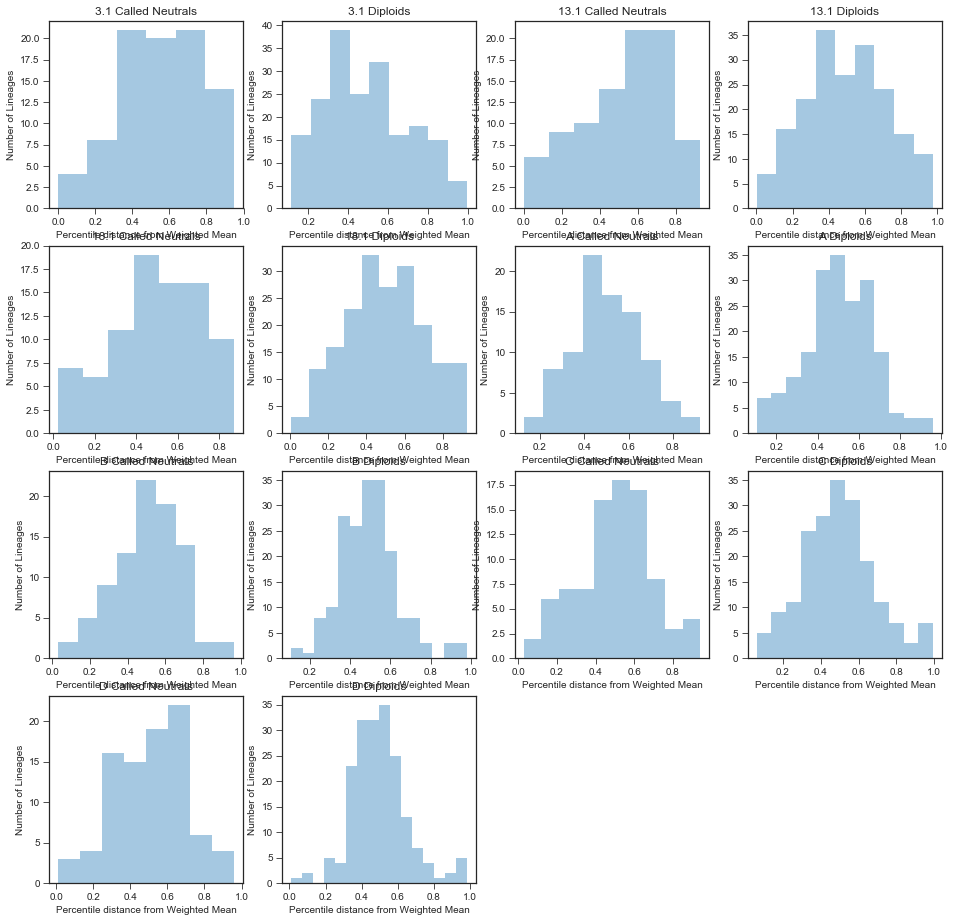

In [131]:
diploid_bcs = fitness_df[fitness_df['mutation_type']=='Diploid']['barcode'].values

plt.figure(figsize=(4*4,4*5))
for r,(rep,output) in enumerate(save_for_later_dict.items()):
    
    comparison_sets = [output['neutralBarcodes'],diploid_bcs]
    comparison_names = ['Called Neutrals','Diploids']
    for c,c_set in enumerate(comparison_sets):
        plt.subplot(5,4,r*len(comparison_sets)+c+1)

        set_locs = np.where(np.isin(output['barcodes'],c_set))[0]
    #     diploid_locs = np.where(np.isin(output['barcodes'],output['neutralBarcodes']))[0]
        if np.sum(~np.isnan(output['zScores'][set_locs])) > 5:
#             sns.distplot(output['aveFitness'][set_locs]-np.mean(output['aveFitness'][set_locs]),kde=False,norm_hist=True)
#             xs = np.linspace(-1,1,100)
#             sns.distplot(np.random.normal(0,output['aveError'][set_locs]))
#             plt.plot(xs,[gaussian(x,0,np.mean(output['aveError'][set_locs])) for x in xs],color='k') 
            
            truth_est, var = tools.inverse_variance_mean(output['aveFitness'][set_locs],output['aveError'][set_locs])
            
            percentiles = [scipy.stats.norm.cdf(truth_est,output['aveFitness'][loc],output['aveError'][loc]) for loc in set_locs]
            
            sns.distplot(percentiles,kde=False)
#             print(np.std(output['zScores'][set_locs]-np.mean(output['zScores'][set_locs])))
#             print(output['kappas'][-1])
#             print(output['multNoiseParams'])
#             plt.plot(xs,[gaussian(x,0,output['kappas'][-1]) for x in xs],color='r')
#             plt.plot(xs,[gaussian(x,0,1) for x in xs],color='k') 
#             plt.plot(xs,[gaussian(x,0,output['kappas'][-1]+output['multNoiseParams']*) for x in xs],color='b')

            plt.title(f"{rep} {comparison_names[c]}")
            plt.xlabel('Percentile distance from Weighted Mean')
            plt.ylabel('Number of Lineages')
plt.savefig('percentile_histograms.pdf',bbox_inches='tight')

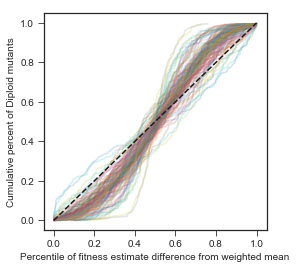

In [16]:
plt.figure(figsize=(4,4))
diploid_bcs = fitness_df[fitness_df['mutation_type']=='Diploid']['barcode'].values

for r,(rep,output) in enumerate(save_for_later_dict.items()):
    
    comparison_sets = [diploid_bcs]
    comparison_names = ['Diploids']
    for c,c_set in enumerate(comparison_sets):

        set_locs = np.where(np.isin(output['barcodes'],c_set))[0]
        if np.sum(~np.isnan(output['zScores'][set_locs])) > 5:

            truth_est, var = tools.inverse_variance_mean(output['aveFitness'][set_locs],output['aveError'][set_locs])
            
            percentiles = [scipy.stats.norm.cdf(truth_est,output['aveFitness'][loc],output['aveError'][loc]) for loc in set_locs]
            
            plt.plot(sorted(percentiles),np.arange(len(percentiles))/len(percentiles),alpha=0.2)
            
            np.where(sorted(percentiles))

plt.xlabel('Percentile of fitness estimate difference from weighted mean')
plt.ylabel('Cumulative percent of Diploid mutants')
plt.plot([0,1],[0,1],'k--')
plt.savefig('../figures/figureS1A.pdf',bbox_inches='tight')

0 0
0 1
0 2
0 3
1 0
1 1
1 2
1 3
2 0
2 1
2 2
2 3
3 0
3 1
3 2
3 3
4 0
4 1
4 2
4 3
5 0
5 1
5 2
5 3
6 0
6 1
6 2
6 3


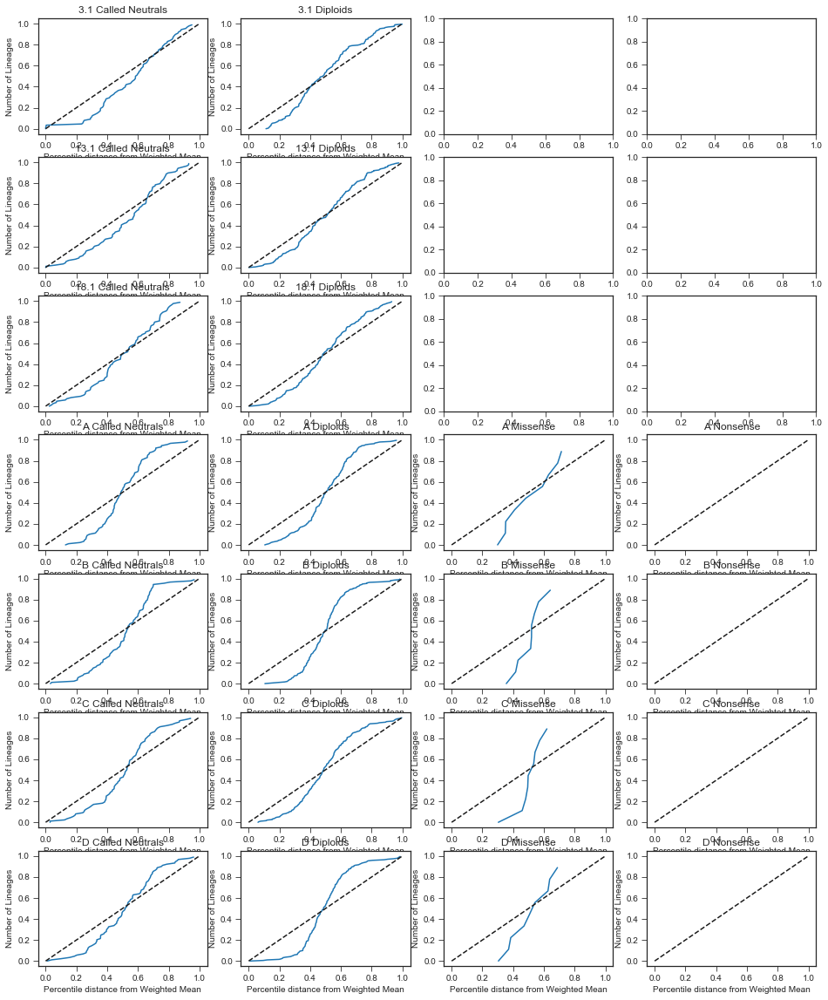

In [152]:
diploid_bcs = fitness_df[fitness_df['mutation_type']=='Diploid']['barcode'].values

plt.figure(figsize=(4*4,4*5))
for r,(rep,output) in enumerate(save_for_later_dict.items()):
    
    comparison_sets = [output['neutralBarcodes'],diploid_bcs,spike_in_missense,spike_in_nonsense]
    comparison_names = ['Called Neutrals','Diploids','Missense','Nonsense']
    for c,c_set in enumerate(comparison_sets):
        print(r,c)
        plt.subplot(len(save_for_later_dict.keys()),4,r*len(comparison_sets)+c+1)

        set_locs = np.where(np.isin(output['barcodes'],c_set))[0]
    #     diploid_locs = np.where(np.isin(output['barcodes'],output['neutralBarcodes']))[0]
        if np.sum(~np.isnan(output['zScores'][set_locs])) > 5:
            
#             sns.distplot(output['aveFitness'][set_locs]-np.mean(output['aveFitness'][set_locs]),kde=False,norm_hist=True)
#             xs = np.linspace(-1,1,100)
#             sns.distplot(np.random.normal(0,output['aveError'][set_locs]))
#             plt.plot(xs,[gaussian(x,0,np.mean(output['aveError'][set_locs])) for x in xs],color='k') 
            
            truth_est, var = tools.inverse_variance_mean(output['aveFitness'][set_locs],output['aveError'][set_locs])
            
            percentiles = [scipy.stats.norm.cdf(truth_est,output['aveFitness'][loc],output['aveError'][loc]) for loc in set_locs]
            
            plt.plot(sorted(percentiles),np.arange(len(percentiles))/len(percentiles))
            plt.plot([0,1],[0,1],'k--')

            plt.title(f"{rep} {comparison_names[c]}")
            plt.xlabel('Percentile distance from Weighted Mean')
            plt.ylabel('Number of Lineages')
plt.savefig('percentile_cdfs.pdf',bbox_inches='tight')

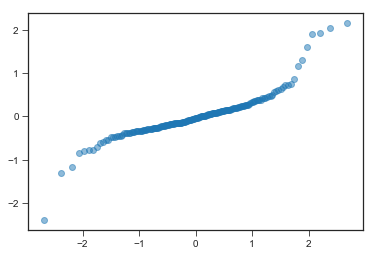

In [145]:
# plt.scatter(sorted(sds),sorted(sds))
plt.scatter(scipy.stats.probplot(sds)[0][0],scipy.stats.probplot(sds)[0][1],alpha=0.5)
# sns.distplot(sds)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


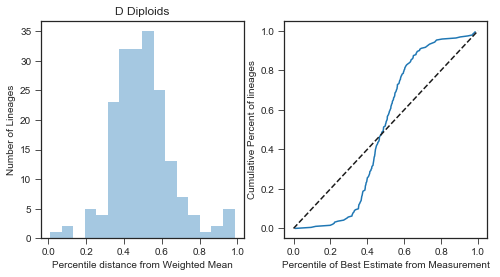

In [147]:
plt.figure(figsize=(8,4))
plt.subplot(121)
sns.distplot(percentiles,kde=False)

plt.title(f"{rep} {comparison_names[c]}")
plt.xlabel('Percentile distance from Weighted Mean')
plt.ylabel('Number of Lineages')

plt.subplot(122)

plt.plot(sorted(percentiles),np.arange(len(percentiles))/len(percentiles))
plt.plot([0,1],[0,1],'k--')
plt.xlabel('Percentile of Best Estimate from Measurement')
plt.ylabel('Cumulative Percent of lineages')
plt.savefig('percentile_side_by_side.pdf',bbox_inches='tight')
# xs = np.linspace(0,1,1000)
# plt.plot(xs,[scipy.stats.norm.cdf(x) for x in xs])

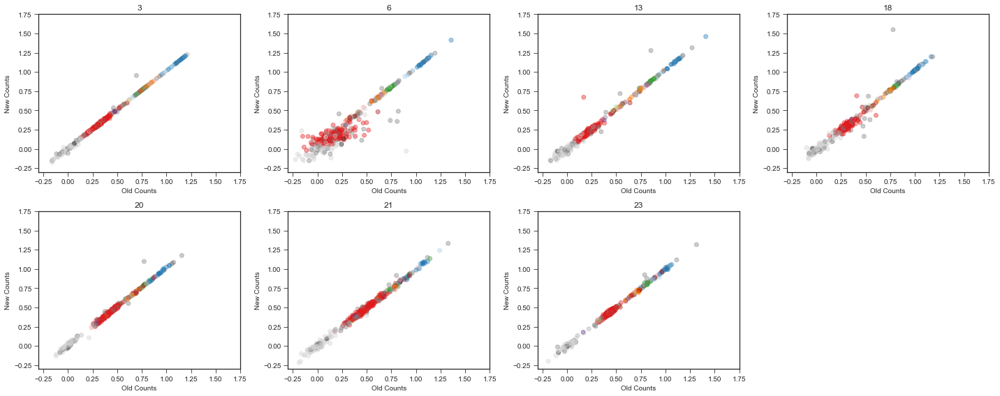

In [18]:
my_df = fitness_df.dropna(how='all',axis=1).dropna()

m3_old_counts =  ['3','6','13','18','20','21','23']

colors = [mutant_colorset[gene] for gene in my_df['mutation_type'].values]

plt.figure(figsize=(5*4,2*4))
for c,condition in enumerate(m3_old_counts):
    plt.subplot(2,4,c+1)
    plt.title(condition)
    plt.scatter(my_df[f'{condition}_fitness'].values,my_df[f'M3_Batch_{condition}_fitness'].values,color=colors,alpha=0.4)
    plt.xlabel('Old Counts')
    plt.ylabel('New Counts')
    plt.xlim(-0.3,1.75)
    plt.ylim(-0.3,1.75)
    plt.tight_layout()
# plt.savefig('old_m3_fitness_from_count_method_comparison_weighted.pdf',bbox_inches='tight')
    

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


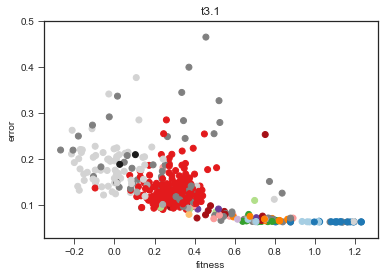

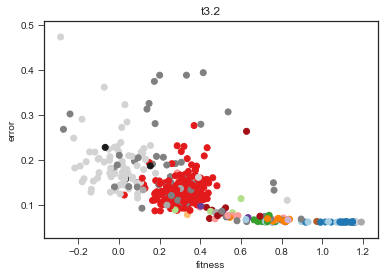

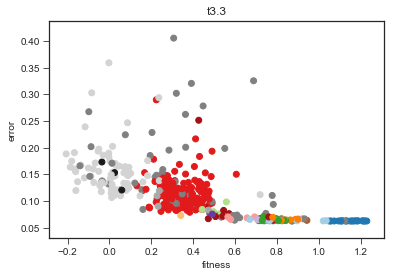

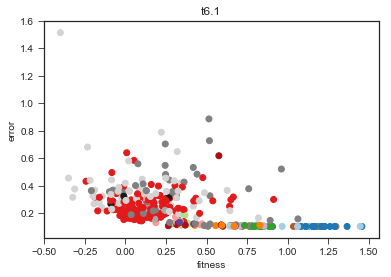

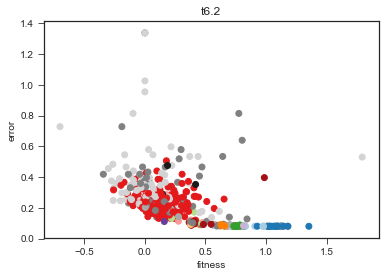

...

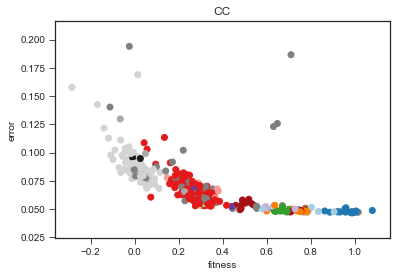

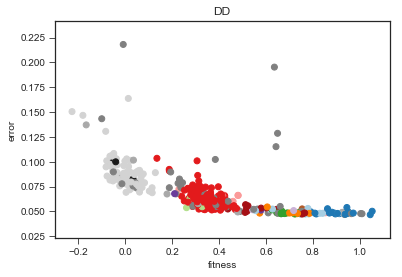

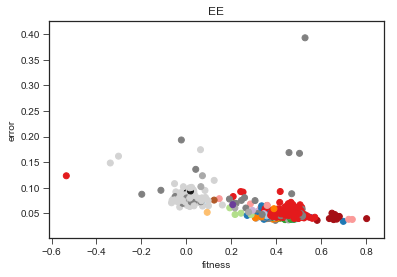

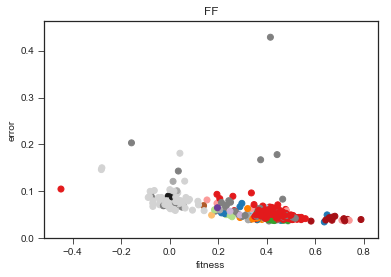

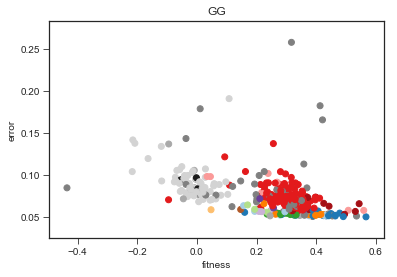

In [19]:
for rep in just_reps:
    plt.figure()
    this_condition = fitness_df
    plt.title(f'{rep}')
    plt.scatter(my_df[f'{rep}_fitness'],my_df[f'{rep}_error'],color=colors)
    
    plt.xlabel('fitness')
    plt.ylabel('error')



/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


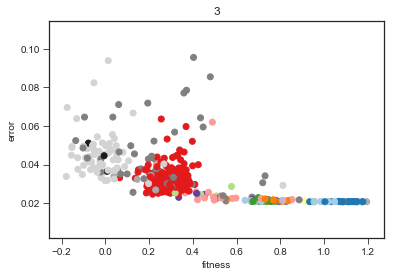

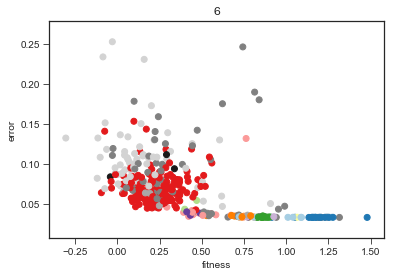

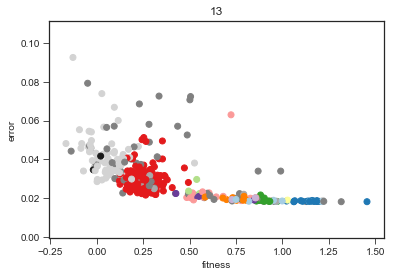

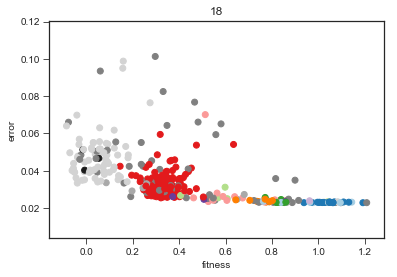

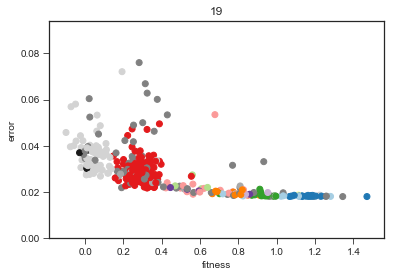

...

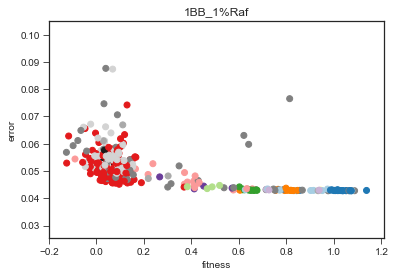

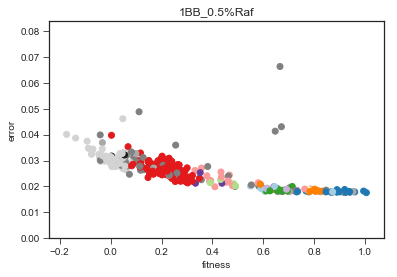

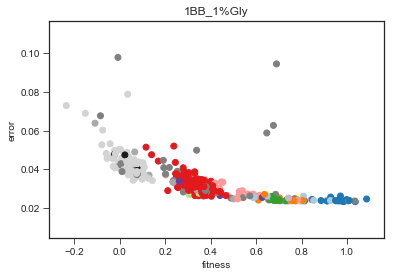

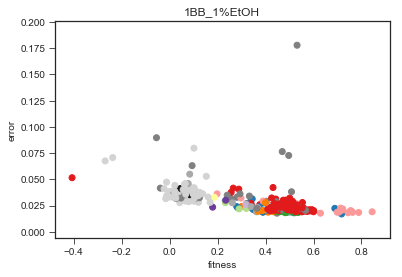

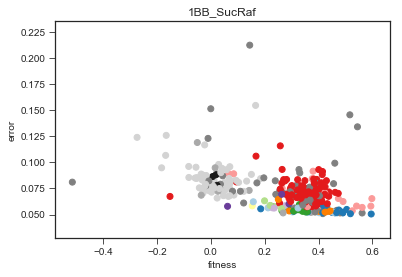

In [20]:
for condition in conditions:
    plt.figure()
    this_condition = fitness_df
    plt.title(f'{condition}')
    plt.scatter(my_df[f'{condition}_fitness'],my_df[f'{condition}_error'],color=colors)
    
    plt.xlabel('fitness')
    plt.ylabel('error')

In [14]:
import re

bigbatch_columns = [col for col in fitness_df.columns if re.split('_fitness|_error',col)[0] in list(bigbatch_conditions.keys())+['barcode','gene','mutation_type']]

In [15]:
fitness_df[bigbatch_columns].dropna()

,barcode,gene,1BB_M3_fitness,1BB_M3_error,1BB_Baffle_fitness,1BB_Baffle_error,1BB_1.4%Gluc_fitness,1BB_1.4%Gluc_error,1BB_1.8%Gluc_fitness,1BB_1.8%Gluc_error,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
0,53,Diploid,0.334623,0.018096,0.247021,0.025211,0.325583,0.028438,0.344345,0.023324,...,0.051067,0.253167,0.025377,0.324651,0.029848,0.487251,0.023327,0.331527,0.066704,Diploid
1,151,IRA1,0.978430,0.016838,0.890395,0.020082,1.044271,0.019905,1.027013,0.016026,...,0.042757,0.993474,0.017607,1.013754,0.023293,0.667971,0.017206,0.566747,0.050538,IRA1_nonsense
2,262,NotSequenced,0.329989,0.018477,0.218867,0.026292,0.340665,0.030043,0.379303,0.024684,...,0.057414,0.274921,0.026767,0.321214,0.030904,0.457856,0.025415,0.311470,0.069112,NotSequenced_adaptive
3,273,IRA1,0.797825,0.016903,0.825684,0.020632,0.850598,0.020410,0.844917,0.016598,...,0.042864,0.767018,0.017945,0.789914,0.023688,0.448947,0.019036,0.424815,0.051958,IRA1_nonsense
4,323,NotSequenced,0.722565,0.017003,0.907751,0.021007,0.788440,0.021129,0.648618,0.017606,...,0.043405,0.634973,0.018818,0.639268,0.024447,0.388429,0.021309,0.265271,0.055560,NotSequenced_adaptive
5,415,IRA1,0.945331,0.016900,0.805211,0.021799,1.141247,0.020189,0.884238,0.016796,...,0.042814,0.877220,0.017811,0.957795,0.023695,0.353242,0.021149,0.387105,0.051755,IRA1_nonsense
7,622,NotSequenced,0.313525,0.018673,0.226939,0.027448,0.280736,0.031548,0.316987,0.025821,...,0.056530,0.176342,0.028052,0.280814,0.032839,0.442872,0.026338,0.329914,0.074400,NotSequenced_adaptive
8,689,IRA1,0.983861,0.017114,0.850815,0.025074,1.143979,0.021363,0.996822,0.018489,...,0.042973,0.981290,0.018312,1.065145,0.024688,0.654502,0.023860,0.478547,0.055007,IRA1_nonsense
9,697,NotSequenced,0.305186,0.018563,0.231726,0.026724,0.323291,0.030285,0.335592,0.024719,...,0.053480,0.201688,0.027394,0.274281,0.032049,0.441291,0.025497,0.301734,0.072495,NotSequenced_adaptive
12,1379,NotSequenced,0.918897,0.016843,0.828275,0.020305,1.052540,0.019900,0.917460,0.016191,...,0.042765,0.857421,0.017653,0.960951,0.023342,0.402543,0.018205,0.388009,0.050921,NotSequenced_adaptive


In [48]:
my_df = fitness_df[bigbatch_columns].dropna()
bcs = my_df['barcode'].values
my_df = fitness_df[fitness_df['barcode'].isin(bcs)]

spike_in_missense = [9000000 + i for i in range(11)]
spike_in_nonsense = [9000100 + i for i in range(11)]
gpb2s = [bc for bc in my_df[my_df['gene']=='GPB2']['barcode'].values]
pde2s = [bc for bc in my_df[my_df['gene']=='PDE2']['barcode'].values]
diploids = [bc for bc in my_df[my_df['mutation_type']=='Diploid']['barcode'].values]

classes = [spike_in_missense,spike_in_nonsense,gpb2s,pde2s,diploids]
class_names = ['IRA1_missense','IRA1_nonsense','GPB2','PDE2','Diploid']
class_colors = [tools.mutant_colorset['IRA1_missense'],tools.mutant_colorset['IRA1_nonsense'],'g','orange',tools.mutant_colorset['Diploid']]

# classes = [spike_in_missense,spike_in_nonsense,gpb2s,pde2s]
# class_names = ['Missense','Nonsense','GPB2','PDE2']
# class_colors = ['b','r','g','orange']

classes = [spike_in_missense,spike_in_nonsense,gpb2s]
class_names = ['IRA1_missense','IRA1_nonsense','GPB2','PDE2','Diploid']
class_colors = ['b','r','g']

classes = [spike_in_missense,spike_in_nonsense]
class_names = ['IRA1_missense','IRA1_nonsense','GPB2','PDE2','Diploid']
class_colors = ['b','r','g']

In [67]:
my_df[my_df['barcode'].isin(spike_in_nonsense)][['barcode']+cols]

,barcode,A_fitness,B_fitness,C_fitness,D_fitness,1BB_M3_fitness
539,9000101,0.842670,0.817150,0.754151,0.830488,0.811121
541,9000104,0.834507,0.841165,0.802254,0.824720,0.825655
542,9000105,0.878617,0.781804,0.778983,0.835209,0.818846
543,9000106,0.839515,0.822620,0.773630,0.823812,0.814989
544,9000107,0.932579,0.768195,0.541120,0.659075,0.727287
546,9000109,0.815294,0.811564,0.782693,0.791630,0.800355
547,9000110,0.867743,0.826161,0.756030,0.866089,0.829038


['barcode',
 'gene',
 '1BB_M3_fitness',
 '1BB_M3_error',
 '1BB_Baffle_fitness',
 '1BB_Baffle_error',
 '1BB_1.4%Gluc_fitness',
 '1BB_1.4%Gluc_error',
 '1BB_1.8%Gluc_fitness',
 '1BB_1.8%Gluc_error',
 '1BB_0.2MNaCl_fitness',
 '1BB_0.2MNaCl_error',
 '1BB_0.5MNaCl_fitness',
 '1BB_0.5MNaCl_error',
 '1BB_0.2MKCl_fitness',
 '1BB_0.2MKCl_error',
 '1BB_0.5MKCl_fitness',
 '1BB_0.5MKCl_error',
 '1BB_8.5uMGdA_fitness',
 '1BB_8.5uMGdA_error',
 '1BB_17uMGdA_fitness',
 '1BB_17uMGdA_error',
 '1BB_2ugFlu_fitness',
 '1BB_2ugFlu_error',
 '1BB_0.5ugFlu_fitness',
 '1BB_0.5ugFlu_error',
 '1BB_1%Raf_fitness',
 '1BB_1%Raf_error',
 '1BB_0.5%Raf_fitness',
 '1BB_0.5%Raf_error',
 '1BB_1%Gly_fitness',
 '1BB_1%Gly_error',
 '1BB_1%EtOH_fitness',
 '1BB_1%EtOH_error',
 '1BB_SucRaf_fitness',
 '1BB_SucRaf_error',
 'mutation_type']

In [55]:
my_df[my_df['barcode'].isin(tools.flatten(classes))]

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error,mutation_type
530,9000001,IRA1,missense,Haploid,PKA,None,1.509015,-0.287682,NaN,NaN,...,0.048991,0.568345,0.026823,0.546338,0.037512,0.145536,0.059269,0.235224,0.080955,IRA1_other
531,9000002,IRA1,missense,Haploid,PKA,None,0.506911,0.596988,0.776610,0.000000,...,0.044035,0.576289,0.020591,0.546652,0.029295,0.050589,0.042964,0.231848,0.059584,IRA1_other
532,9000003,IRA1,missense,Haploid,PKA,None,0.556432,1.078412,0.848261,0.816631,...,0.044206,0.627015,0.020675,0.585716,0.026868,0.175595,0.031598,0.261934,0.058378,IRA1_other
533,9000005,IRA1,missense,Haploid,PKA,None,0.469304,0.691227,0.903318,-0.019851,...,0.044285,0.597446,0.021126,0.545671,0.027657,0.177520,0.031995,0.239900,0.060020,IRA1_other
534,9000006,IRA1,missense,Haploid,PKA,None,1.055569,0.000000,0.835317,0.000000,...,0.047259,0.578082,0.024850,0.549543,0.033520,0.139940,0.048980,0.250735,0.072008,IRA1_other
535,9000007,IRA1,missense,Haploid,PKA,None,1.218249,0.373017,2.420167,0.000000,...,0.047644,0.575607,0.025810,0.570887,0.034169,0.137446,0.050893,0.235116,0.077376,IRA1_other
536,9000008,IRA1,missense,Haploid,PKA,None,0.999307,0.000000,NaN,NaN,...,0.048865,0.563305,0.027735,0.510189,0.038251,0.203304,0.057287,0.231843,0.082401,IRA1_other
537,9000009,IRA1,missense,Haploid,PKA,None,0.687133,0.309391,1.180497,0.000000,...,0.047203,0.558907,0.025199,0.574359,0.034077,0.183150,0.050694,0.256917,0.075957,IRA1_other
538,9000010,IRA1,missense,Haploid,PKA,None,NaN,NaN,1.180497,0.000000,...,0.045570,0.633576,0.022482,0.599062,0.029676,0.202520,0.038672,0.278204,0.065341,IRA1_other
539,9000101,IRA1,stop_gained,Haploid,PKA,None,0.268854,0.230124,0.567922,-0.079403,...,0.043094,0.766071,0.018684,0.759680,0.025142,0.066810,0.032203,0.285591,0.053813,IRA1_nonsense


([<matplotlib.axis.XTick at 0x1151c23c8>,
 <a list of 5 Text xticklabel objects>)

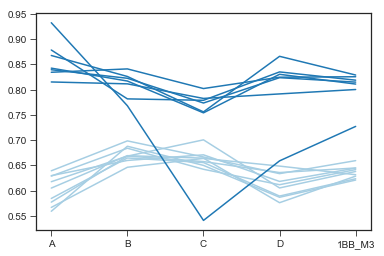

In [66]:
cols = ['A_fitness','B_fitness','C_fitness','D_fitness','1BB_M3_fitness']

for c,this_class in enumerate(classes):
    
    class_name = class_names[c]
    f_values = my_df[my_df['barcode'].isin(this_class)][cols].values.swapaxes(0,1)
    e_values = my_df[my_df['barcode'].isin(this_class)][[col.replace('fitness','error') for col in cols]].values.swapaxes(0,1)
    plt.plot(f_values,color=tools.mutant_colorset[class_name])
plt.xticks(range(len(cols)),[col.replace('_fitness','') for col in cols])
#     plt.errorbar(x=range(4),y=f_values,yerr=e_values,color=tools.mutant_colorset[class_name])

In [1]:
cols = ['A_fitness','B_fitness','C_fitness','D_fitness']
cols = [col + '_fitness'for col in bigbatch_conditions]

for c,this_class in enumerate(classes):
    
    class_name = class_names[c]
    f_values = my_df[my_df['barcode'].isin(this_class)][cols].values.swapaxes(0,1)
    e_values = my_df[my_df['barcode'].isin(this_class)][[col.replace('fitness','error') for col in cols]].values.swapaxes(0,1)
    plt.plot(f_values,color=tools.mutant_colorset[class_name])
plt.xticks(range(len(cols)),[col.replace('_fitness','') for col in cols],rotation=90)
plt.ylim(-1.5,1.1)
#     plt.errorbar(x=range(4),y=f_values,yerr=e_values,color=tools.mutant_colorset[class_name])

NameError: name 'bigbatch_conditions' is not defined

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


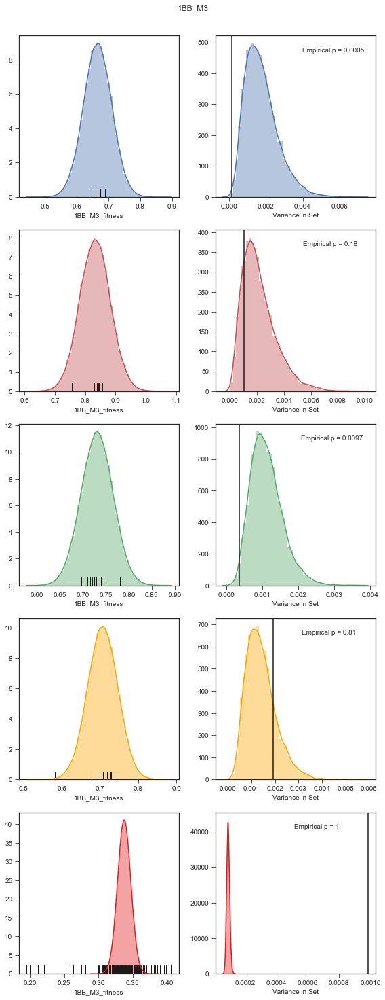

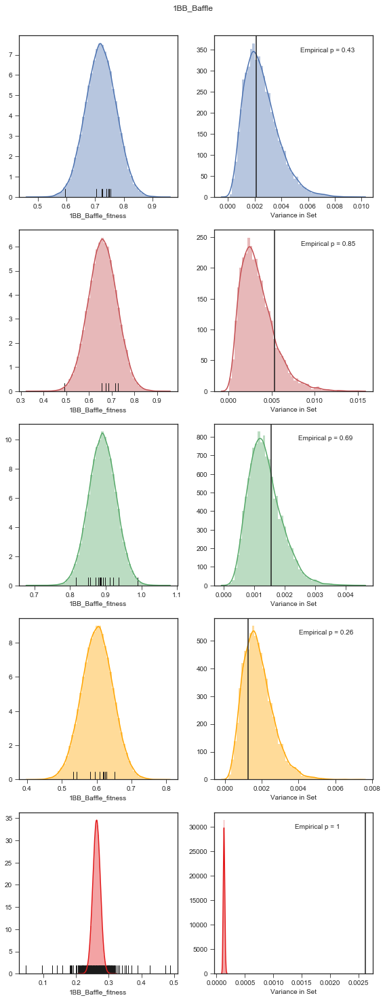

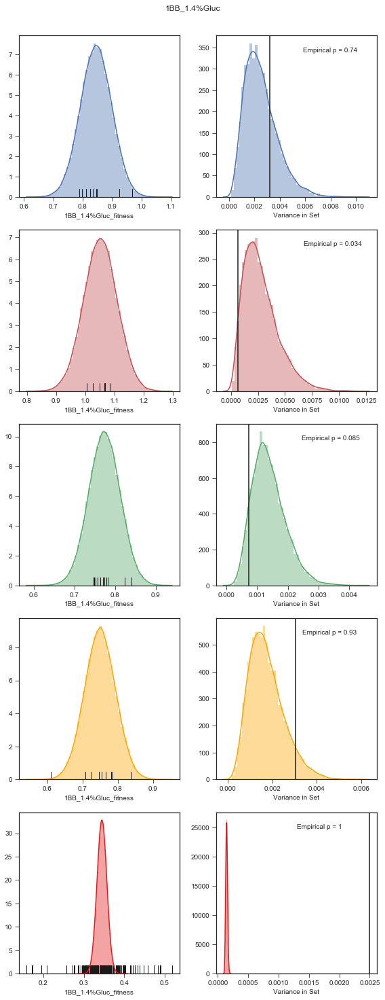

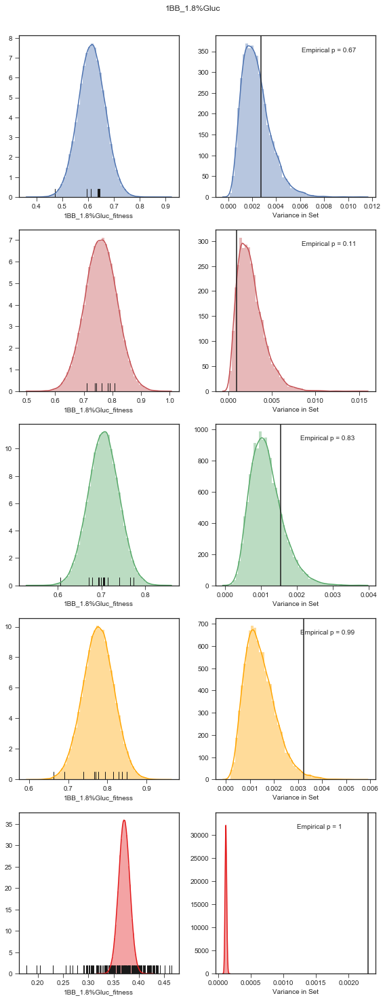

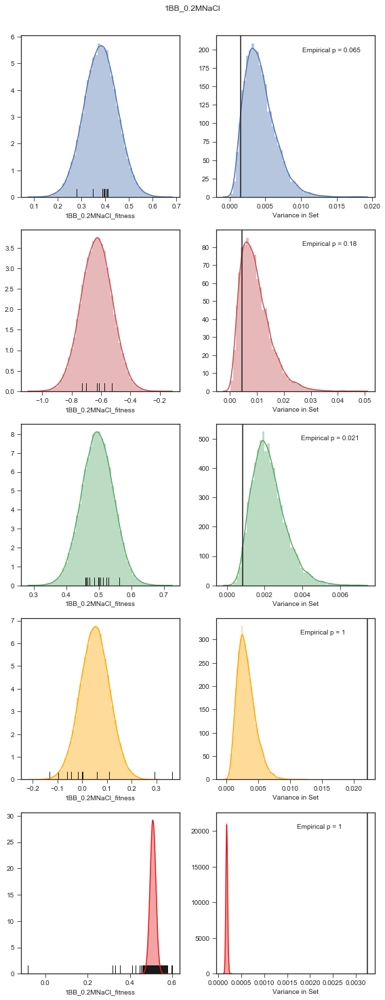

...

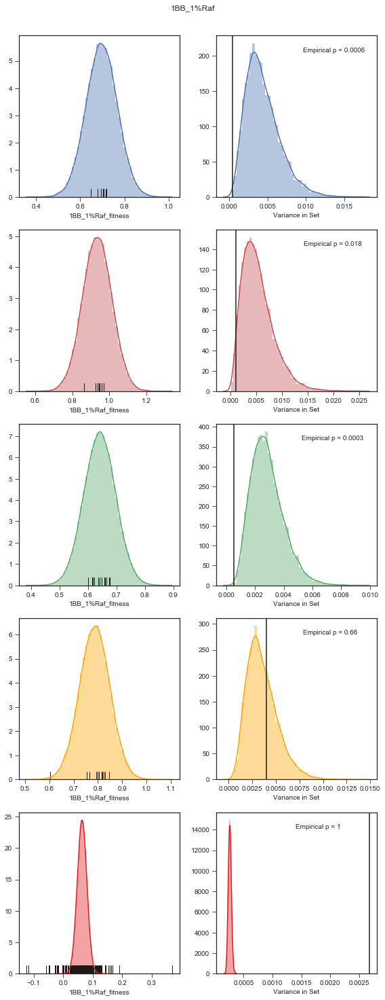

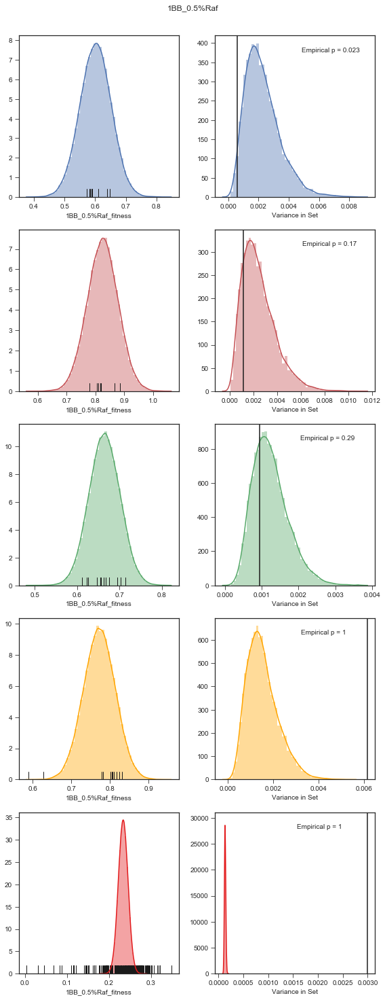

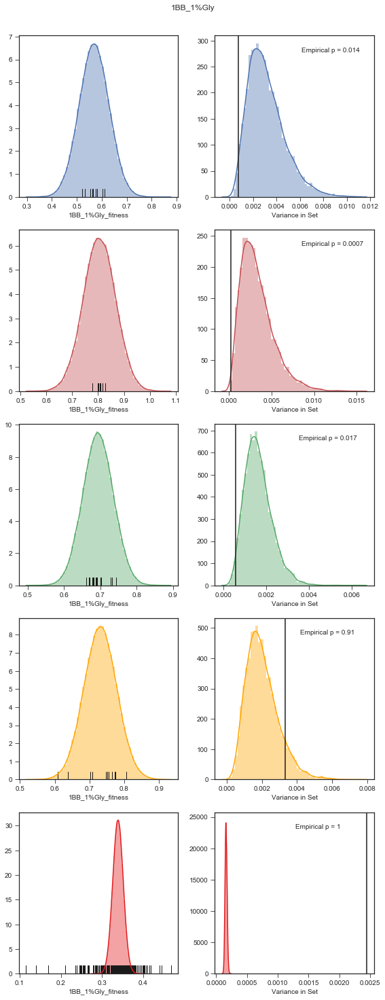

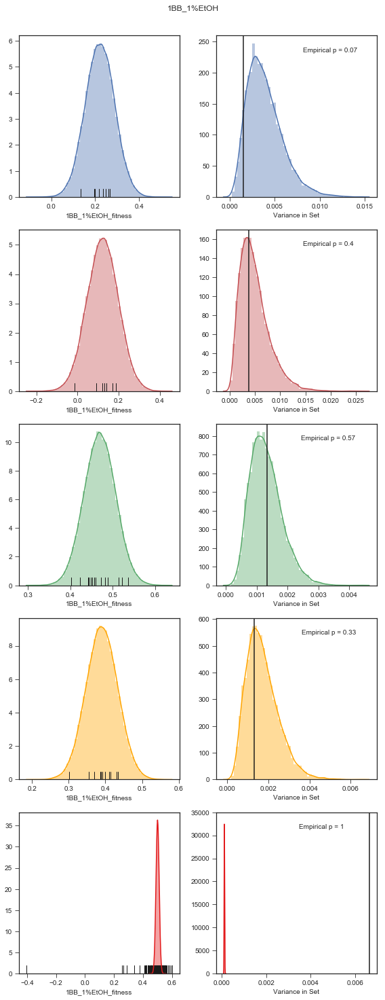

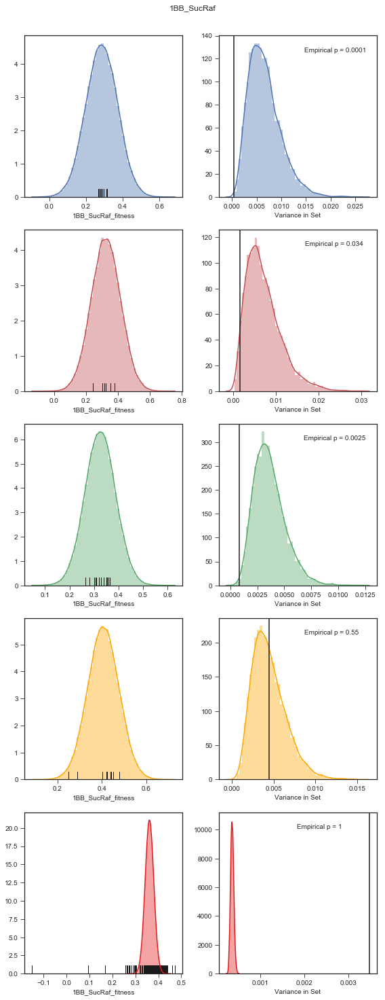

In [43]:
my_df = fitness_df[bigbatch_columns].dropna()

n_samples = 10000
n_classes = len(classes)

pvals = {}
for t,condition in enumerate(list(bigbatch_conditions.keys())):
    plt.figure(figsize=(2*4,n_classes*4))
    plt.suptitle(condition,y=1.02)
    for c,this_class in enumerate(classes):
        
        this_set = my_df[my_df['barcode'].isin(this_class)]

        point_variance = np.var(this_set[f'{condition}_fitness'])
        aggregate_mean, aggregate_variance = tools.inverse_variance_mean(this_set[f'{condition}_fitness'],this_set[f'{condition}_error'])

        sampled_variances = []
        n_bcs = len(this_set[f'{condition}_fitness'])

        all_samples = np.random.normal(aggregate_mean,np.sqrt(aggregate_variance),n_samples*n_bcs)
        sampled_variances = [np.var(all_samples[this_counter*n_bcs:(this_counter+1)*n_bcs]) for this_counter in range(n_samples)]

        plt.subplot(n_classes,2,2*c+1)
#         if c == 0:
#             plt.title('Distribution of Fitness values')

        sns.distplot(this_set[f'{condition}_fitness'],rug=True, hist=False,kde=False,color='k')
        sns.distplot(all_samples,color=class_colors[c],label='Expected Distribution from Noise')
        
        ymin,ymax = plt.ylim()
        xmin,xmax = plt.xlim()
        
#         plt.legend(labels=['_nolabel_']*(len(this_class)-1)+['Estimated Fitness Values','Expected Distribution from Noise'])
#         plt.text(s=f'{class_names[c]}',x=1.1*xmin,y=1.1*ymin)
        
        plt.subplot(n_classes,2,2*c+2)
#         if c == 0:
#             plt.title()

        sns.distplot(sampled_variances,color=class_colors[c],label='Variance across samples')
        plt.axvline(point_variance,color='k',label='Variance across estimates')
#         plt.legend()

        # calculate 1 sided empirical p_value (Proportion of samples with less variance than the real sample)
        empirical_p_value = max(1.0/n_samples,len(np.where(sampled_variances < point_variance)[0])/n_samples)
        
        if t == 0:
            pvals[f'{class_names[c]}'] = [empirical_p_value]
        else:
            pvals[f'{class_names[c]}'].append(empirical_p_value)

        ymin,ymax = plt.ylim()
        xmin,xmax = plt.xlim()
        
        
        plt.text(s=f'Empirical p = {empirical_p_value:.2g}',x=0.5*xmax,y=0.9*ymax)
        plt.xlabel('Variance in Set')
        
        
        plt.tight_layout()

#     plt.savefig(f'../figures/noise_model_figures/{condition}_noisecheck.pdf',bbox_inches='tight')
    

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0,0.5,'Empirical P-value')

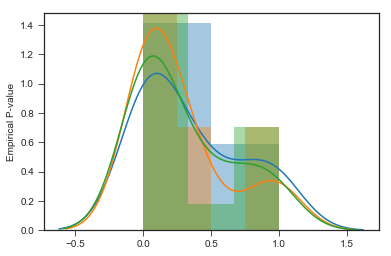

In [58]:
conditions = list(bigbatch_conditions.keys())
plt.figure()
for c,this_class in enumerate(class_names):
#     plt.axhline(0.05,color='k',linestyle='--',alpha=0.3)
#     plt.plot(pvals[this_class],'o',color=class_colors[c],alpha=0.4,label=this_class)
    sns.distplot(pvals[this_class])
plt.ylabel('Empirical P-value')
# plt.legend(loc=(1.0,0.5))
# plt.yscale('log')
# plt.xticks(range(len(conditions)),conditions,rotation=90)
# plt.savefig(f'../figures/noise_model_figures/noisecheck_all_pvals_logscale.pdf',bbox_inches='tight')
    
        

Note that SucRaf only has a single replicate and we seem to be overestimating the uncertainty in measurment - is this because the default alpha value is set too high? What empirical alpha values are we getting from 1BigBatch experiments? Is it reasonable to assume that alpha values hold across experiments? 

We can test this by comparing the inferred alpha values from 1 Big Batch with those of other batch conditions.

Additional Q: is it better to use weighted or unweighted average (of timepoints, etc.)? How do we determine which is better?

In [1]:
my_df = fitness_df.dropna()
    
for rep in just_reps:
    plt.figure()
    plt.scatter(my_df[f'{rep}_fitness'],my_df[f'{rep}_error'])

NameError: name 'fitness_df' is not defined

In [29]:
just_reps

['t3.1',
 't3.2',
 't3.3',
 't6.1',
 't6.2',
 't6.3',
 't13.1',
 't13.2',
 't13.3',
 't18.1',
 't18.2',
 't18.3',
 't19.1',
 't19.2',
 't19.3',
 't20.1',
 't20.2',
 't20.3',
 't21.1',
 't21.2',
 't21.3',
 't23.1',
 't23.2',
 't23.3',
 '3.1',
 '3.2',
 '3.3',
 '6.1',
 '6.2',
 '6.3',
 '13.1',
 '13.2',
 '13.3',
 '18.1',
 '18.2',
 '18.3',
 '20.1',
 '20.2',
 '20.3',
 '21.1',
 '21.2',
 '21.3',
 '23.1',
 '23.2',
 '23.3',
 't14.1',
 't14.2',
 't14.3',
 't15.1',
 't15.2',
 't15.3',
 't16.1',
 't16.2',
 't16.3',
 't17.1',
 't17.2',
 't17.3',
 't5.1',
 't5.2',
 't5.3',
 't7.1',
 't7.2',
 't7.3',
 't8.1',
 't8.2',
 't25.1',
 't25.2',
 't25.3',
 't26.1',
 't26.2',
 't26.3',
 't27.1',
 't27.2',
 't27.3',
 't1.1',
 't1.2',
 't1.3',
 't2.4',
 't2.5',
 't2.6',
 '1.4%-R1',
 '1.4%-R2',
 '1.5%-R1',
 '1.5%-R2',
 '1.6%-R1',
 '1.6%-R2',
 '1.7%-R1',
 '1.7%-R2',
 '1.8%-R1',
 '1.8%-R2',
 'A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 

In [34]:
len(just_reps)-33


90

In [ ]:
data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]

plt.figure(figsize=(5*9,5*14))
for counter,rep in enumerate(just_reps):
    print(rep)
#     if rep in  tools.flatten([i for i in bigbatch_conditions.values()]):
#         counter = counter + 6
#         if counter-26 >= 9:
#             counter += 1
#         if counter-26 >= 18:
#             counter += 1
    ax = plt.subplot(14,9,counter+1)
    timepoints = []
    these_times = []
    if rep in tools.flatten([i for i in old_conditions.values()]):
        
        if '%' in rep or 'Ben' in rep:
            e,r = rep.split('-')
            if e+'-T0' in data.columns:
                these_times.append(e+'-T0')
                timepoints.append(0)
                
            for i in range(1,5):
                if rep+'-T'+str(i) in data.columns:
                    these_times.append(rep+'-T'+str(i))
                    timepoints.append(i)
        else:
            e,r = rep.split('.')
            if e in ['t16','t17']:
                for t in range(1,5):
                    if e+'.'+str(t)+'.'+r+'.x' in data.columns:
                        timepoints.append(t)
                        these_times.append(e+'.'+str(t)+'.'+r+'.x')

            elif 't' in e:
                for t in range(1,5):
                    if e+'.'+str(t)+'.'+r in data.columns:
                        timepoints.append(t)
                        these_times.append(e+'.'+str(t)+'.'+r)
            else:
                for t in range(1,5):
                    if e+'-'+str(t)+'-'+r in data.columns:
                        timepoints.append(t)
                        these_times.append(e+'-'+str(t)+'-'+r)

    if rep in tools.flatten([i for i in bigbatch_conditions.values()]):
        for i in range(5):
            if rep+str(i) in data.columns:
                these_times.append(rep+str(i))
                timepoints.append(i)
    print(these_times)
    BC_counts = data[these_times].values
    ax.plot(timepoints,(BC_counts/np.nansum(BC_counts,axis=0)).swapaxes(0,1),alpha=0.2,color='b')
    plt.yscale('log')
#     plt.title(codenames[condition])
    condition_name = [k for k,v in conditions.items() for this_v in v if this_v == rep][0]
    plt.title(f'{condition_name}-{rep}')
    plt.tight_layout()
    plt.xticks(timepoints,timepoints)
    plt.xlim(-0.1,4.1)
    plt.ylim(10**-5,2*10**-1)
plt.savefig(f'Alltrajectories_old+1bb+gradient_ALLswapscorrected_reshape.pdf',bbox_inches='tight')

['1.4%-T0', '1.4%-R1-T1', '1.4%-R1-T2', '1.4%-R1-T3', '1.4%-R1-T4']
['1.4%-T0', '1.4%-R2-T1', '1.4%-R2-T2', '1.4%-R2-T3', '1.4%-R2-T4']
['1.5%-T0', '1.5%-R1-T1', '1.5%-R1-T2', '1.5%-R1-T3', '1.5%-R1-T4']
['1.5%-T0', '1.5%-R2-T1', '1.5%-R2-T2', '1.5%-R2-T3', '1.5%-R2-T4']
['1.6%-T0', '1.6%-R1-T1', '1.6%-R1-T2', '1.6%-R1-T3', '1.6%-R1-T4']
['1.6%-T0', '1.6%-R2-T1', '1.6%-R2-T2', '1.6%-R2-T3', '1.6%-R2-T4']
['1.7%-T0', '1.7%-R1-T1', '1.7%-R1-T2', '1.7%-R1-T3', '1.7%-R1-T4']
['1.7%-T0', '1.7%-R2-T1', '1.7%-R2-T2', '1.7%-R2-T3', '1.7%-R2-T4']
['1.8%-T0', '1.8%-R1-T1', '1.8%-R1-T2', '1.8%-R1-T3', '1.8%-R1-T4']
['1.8%-T0', '1.8%-R2-T1', '1.8%-R2-T2', '1.8%-R2-T3', '1.8%-R2-T4']


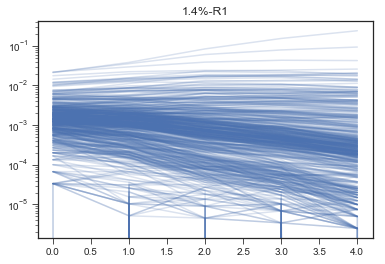

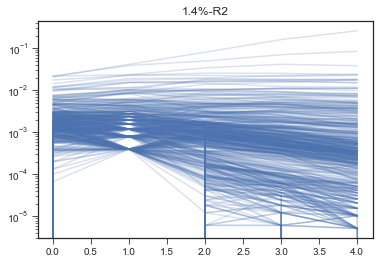

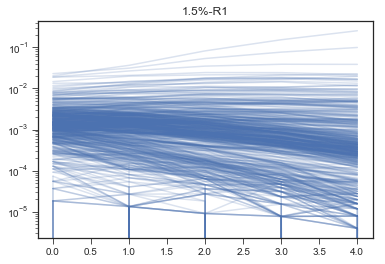

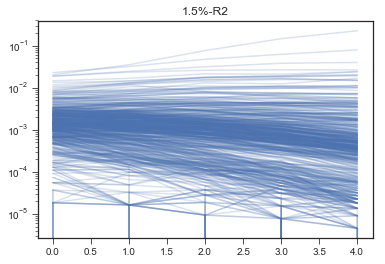

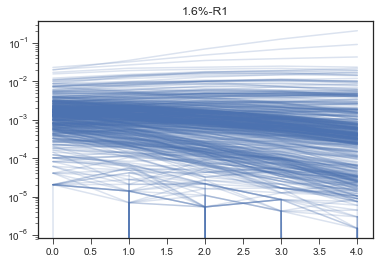

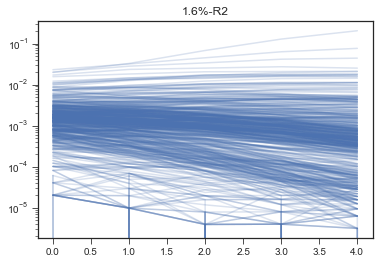

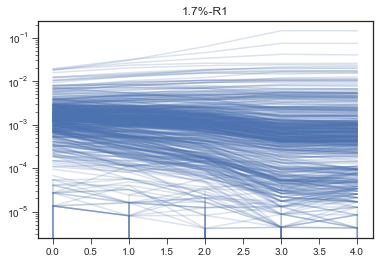

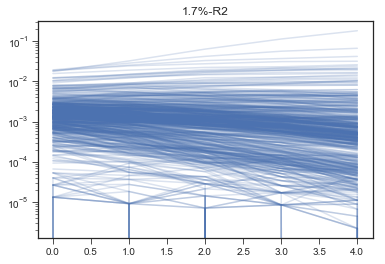

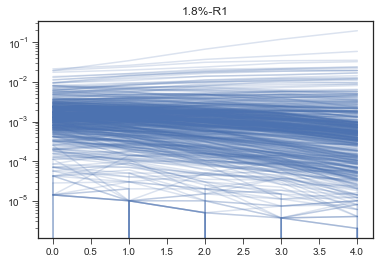

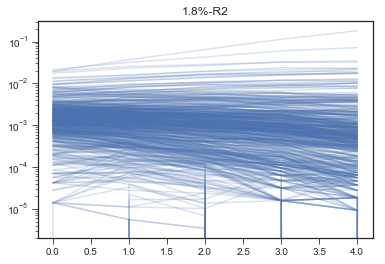

In [44]:
data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]

gradient_reps = ['1.4%-R1','1.4%-R2',
'1.5%-R1','1.5%-R2',
'1.6%-R1','1.6%-R2',
'1.7%-R1','1.7%-R2',
'1.8%-R1','1.8%-R2']


for rep in gradient_reps:
    these_times = []
    timepoints = []

    plt.figure()
    plt.title(rep)
    if rep.split('-')[0]+'-T0' in data.columns:
        these_times.append(rep.split('-')[0]+'-T0')
        timepoints.append(0)
        
    for i in range(1,5):
        if rep+'-T'+str(i) in data.columns:
            these_times.append(rep+'-T'+str(i))
            timepoints.append(i)
            
    print(these_times)


    BC_counts = data[these_times].values
    plt.plot(timepoints,(BC_counts/np.nansum(BC_counts,axis=0)).swapaxes(0,1),alpha=0.2,color='b')
    plt.yscale('log')



In [43]:
BC_counts

array([[2.2000e+01, 1.7400e+02, 1.0900e+02, 8.5000e+01, 6.8000e+01],
       [6.2900e+02, 7.3740e+03, 1.8479e+04, 4.4673e+04, 9.6279e+04],
       [1.1800e+02, 4.6100e+02, 2.5600e+02, 2.0000e+02, 1.5200e+02],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
       [0.0000e+00, 4.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00],
       [6.0000e+00, 1.5000e+01, 9.0000e+00, 8.0000e+00, 1.0000e+00]])

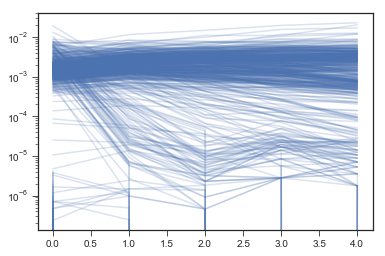

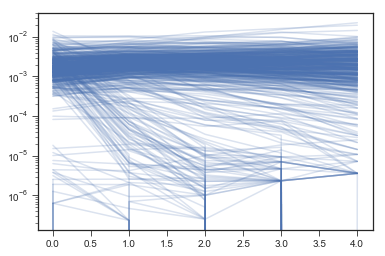

In [13]:
data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]

these_times = ['', 'P1', 'P2', 'P3', 'P4']
timepoints = [0,1,2,3,4]

BC_counts = data[these_times].values
plt.plot(timepoints,(BC_counts/np.nansum(BC_counts,axis=0)).swapaxes(0,1),alpha=0.2,color='b')
plt.yscale('log')

plt.figure()

these_times = ['M0', 'M1', 'M2', 'M3', 'M4']
timepoints = [0,1,2,3,4]

BC_counts = data[these_times].values
plt.plot(timepoints,(BC_counts/np.nansum(BC_counts,axis=0)).swapaxes(0,1),alpha=0.2,color='b')
plt.yscale('log')

In [67]:
remove_swaps = True
weighted = True

data = merged_data
data = data[~(data['barcode'].isin([7777777,9999999]))]
data = data.sort_values('barcode')
data = data.drop(columns=sparse_samples) # sparse timepoints resulting a lot of missing data
if remove_swaps:
    data = data.drop(columns=[col for col in flask_swaps.keys() if col not in sparse_samples]) # sparse timepoints resulting a lot of missing data
data = data.fillna(0)

cov_thresh = 1000

### called neutral by atish's method in ALL 5000 bc experiments (I think - need to verify this)
### [could also be below some set threshold across all experiments]
full_neutral_list = [17615,18486,42040,45014,58284,63611,73731,74185,80465,94896
,120600,125697,132511,134852,135750,190551,228237,238783,255561,298344
,308537,316954,317346,335717,411685,454359,469053] 

### from previous list but never has fitness above 3.5% (per gen) in any of 5000bc experiments
supergood_neutral = [17615, 24362, 42040, 71926, 72939, 73802, 80465, 109476, 113483, 
                     134852, 135750, 238783, 263665, 276406, 316954, 335717, 454359] 

### pulled from supergood list and spiked into 1BigBatch experiments
neutral_spikes = [17615,24362,42040,71926,73802,109476,113483,134852,263665,316954]

# neutrals = full_neutral_list
neutrals = list(np.unique(full_neutral_list+supergood_neutral+neutral_spikes))

neutrals = [bc for bc in data['barcode'].values if bc in neutrals]
# neutrals = neutral_spikes
print(neutrals)

weight_comparision = {}

for weighted in [True,False]:

    fitnesses = {}

    other_info = ['barcode','gene','type','ploidy','class','additional_muts']

    for condition,replicates in conditions.items():
        print(condition)
        print(replicates)
        rep_times = {}
        for rep in replicates:

            these_times = []
            timepoints = []
            if condition in old_conditions.keys():
                e,r = rep.split('.')
    #             if e in ['13','15']:
    #                 timepoints.append(0)
    #                 these_times.append('13-0_pool')
    #             else:
    #                 if e+'-0' in data.columns:
    #                     timepoints.append(0)
    #                     these_times.append(e+'-0')
                if e in ['t16','t17']:
                    for t in range(1,5):
                        if e+'.'+str(t)+'.'+r+'.x' in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'.'+str(t)+'.'+r+'.x')

                elif 't' in e:
                    for t in range(1,5):
                        if e+'.'+str(t)+'.'+r in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'.'+str(t)+'.'+r)
                else:
                    for t in range(1,5):
                        if e+'-'+str(t)+'-'+r in data.columns:
                            timepoints.append(t)
                            these_times.append(e+'-'+str(t)+'-'+r)


            if condition in bigbatch_conditions.keys():
                for i in range(5):
                    if rep+str(i) in data.columns:
                        these_times.append(rep+str(i))
                        timepoints.append(i)

            rep_times[rep] = data[these_times].values
            print(timepoints)
            print(rep)
        print({rep:np.nansum(rep_times[rep],axis=0) for rep in rep_times.keys()})
        print(rep_times)
        answer = atish.inferFitness(data['barcode'].values,timepoints,rep_times,
                                    neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=True,useMultNoise=True,weightedMean=weighted)


        for rep in replicates:

            fitnesses[rep+'_fitness'] = answer[rep]['aveFitness']
            fitnesses[rep+'_error'] = answer[rep]['aveError']

    for other_setting in other_info:
        if other_setting in data.columns:
            fitnesses[other_setting] = data[other_setting].values

    fitness_df = p.DataFrame(fitnesses)
    fitness_df = fitness_df.replace([np.inf, -np.inf], np.nan)
    # fitness_df = fitness_df.replace([float('Inf'),-float('Inf'),np.inf, -np.inf], np.nan)

    for condition,replicates in conditions.items():


        fitness_df[condition+'_fitness'] = np.nansum([fitness_df[rep+'_fitness'].values/fitness_df[rep+'_error'].values for rep in replicates],axis=0) \
        /np.nansum([1.0/fitness_df[rep+'_error'].values for rep in replicates],axis=0)

        fitness_df[condition+'_error'] = np.nansum([1.0/fitness_df[rep+'_error'].values for rep in replicates],axis=0)**(-1)



    fitness_df = fitness_df[other_info+[col for col in fitness_df if col not in other_info]]
    
    weight_comparision[weighted] = fitness_df

[17615, 24362, 42040, 71926, 72939, 73802, 109476, 113483, 120600, 134852, 263665, 298344, 316954]
3
['t3.1', 't3.2', 't3.3']
[1, 2, 3, 4]
t3.1
[1, 2, 3, 4]
t3.2
[1, 2, 3, 4]
t3.3
{'t3.1': array([1351750., 2135554., 1618035., 3250337.]), 't3.2': array([1933347., 2417818., 3119308., 2877315.]), 't3.3': array([1283986., 2070974., 2469955., 3200478.])}
{'t3.1': array([[2.32000e+02, 1.72000e+02, 7.90000e+01, 9.90000e+01],
       [5.20510e+04, 9.83780e+04, 9.78250e+04, 2.08593e+05],
       [1.08300e+03, 7.16000e+02, 2.76000e+02, 2.08000e+02],
       ...,
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00],
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00],
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00]]), 't3.2': array([[3.55000e+02, 1.50000e+02, 9.30000e+01, 6.60000e+01],
       [8.41730e+04, 1.15547e+05, 1.79070e+05, 2.02527e+05],
       [1.75800e+03, 6.60000e+02, 4.32000e+02, 2.04000e+02],
       ...,
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+

/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_a

neutral reads 574.0 487.0
neutral reads 2513.0 1479.0
neutral reads 1479.0 609.0
neutral reads 609.0 901.0
neutral reads 2513.0 1479.0
neutral reads 1479.0 609.0
neutral reads 609.0 901.0
Multiplicative noise consistency checks

t19.1  inconsistent times:

kappas [1.62140554 1.69808047 1.2699664 ]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies


t19.2  inconsistent times:

kappas [1.84854257 1.47620838 1.8913181 ]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies


t19.3  inconsistent times:

kappas [1.48827933 1.65675236 1.50505275]
multNoise [0.10725578 0.06744769 0.16204325]
No clear inconsistencies

20
['t20.1', 't20.2', 't20.3']
[1, 2, 3, 4]
t20.1
[1, 2, 3, 4]
t20.2
[1, 2, 3, 4]
t20.3
{'t20.1': array([ 307255., 1250628., 1089708.,  698235.]), 't20.2': array([1000502., 1275604.,  955884., 1226901.]), 't20.3': array([1129711., 1004777.,  930511., 1276530.])}
{'t20.1': array([[  555.,  2059.,  1387.,   696.],
       [ 4183., 19716., 28903., 

neutral reads 3939.0 1558.0
neutral reads 1558.0 782.0
neutral reads 782.0 284.0
neutral reads 3939.0 1558.0
neutral reads 1558.0 782.0
neutral reads 782.0 284.0
neutral reads 3368.0 1959.0
neutral reads 1959.0 776.0
neutral reads 776.0 430.0
neutral reads 3368.0 1959.0
neutral reads 1959.0 776.0
neutral reads 776.0 430.0
Multiplicative noise consistency checks

3.1  inconsistent times:

kappas [1.7437897  2.31538368 1.81788505]
multNoise [0.11285201 0.11902568 0.10235688]
No clear inconsistencies


3.2  inconsistent times:

kappas [4.73791928 5.1001428  1.46530054]
multNoise [0.11285201 0.11902568 0.10235688]
No clear inconsistencies


3.3  inconsistent times:

kappas [1.82660715 1.23125876 1.07245026]
multNoise [0.11285201 0.11902568 0.10235688]
No clear inconsistencies

M3_Batch_6
['6.1', '6.2', '6.3']
[1, 2, 3, 4]
6.1
[1, 3, 4]
6.2
[2, 3, 4]
6.3
{'6.1': array([1671081., 1912465., 3111800., 5779961.]), '6.2': array([1332407., 4294330., 2323633.]), '6.3': array([1130390., 3601479., 2

neutral reads 5114.0 3611.0
neutral reads 3611.0 1950.0
neutral reads 1950.0 977.0
neutral reads 5114.0 3609.0
neutral reads 3609.0 1950.0
neutral reads 1950.0 977.0
neutral reads 4793.0 3764.0
neutral reads 3764.0 1716.0
neutral reads 1716.0 891.0
neutral reads 4793.0 3763.0
neutral reads 3763.0 1716.0
neutral reads 1716.0 891.0
Multiplicative noise consistency checks

23.1  inconsistent times:

kappas [ 5.23085535  5.02580632 14.24103309]
multNoise [0.1111914  0.22360996 0.19588799]
No clear inconsistencies


23.2  inconsistent times:

kappas [12.92087     2.68153465  0.42254651]
multNoise [0.1111914  0.22360996 0.19588799]
No clear inconsistencies


23.3  inconsistent times:

kappas [3.21657572 2.28271529 0.75594518]
multNoise [0.1111914  0.22360996 0.19588799]
No clear inconsistencies

Ferm_44hr_Transfer
['t14.1', 't14.2', 't14.3']
[1, 2, 3, 4]
t14.1
[1, 2, 3, 4]
t14.2
[1, 2, 3, 4]
t14.3
{'t14.1': array([ 459383.,  754681., 1371749., 1630288.]), 't14.2': array([ 370695., 1078708., 

neutral reads 1228.0 108.0
neutral reads 108.0 387.0
neutral reads 387.0 785.0
neutral reads 1228.0 108.0
neutral reads 108.0 387.0
neutral reads 387.0 785.0
neutral reads 1418.0 1324.0
neutral reads 1324.0 2019.0
neutral reads 2019.0 1918.0
neutral reads 1418.0 1324.0
neutral reads 1324.0 2019.0
neutral reads 2019.0 1918.0
Multiplicative noise consistency checks

t17.1  inconsistent times:

kappas [1.90933733 7.03266771 3.41489615]
multNoise [0.14381961 0.14113048 0.11935539]
No clear inconsistencies


t17.2  inconsistent times:

kappas [0.95885632 8.67749145 1.15953053]
multNoise [0.14381961 0.14113048 0.11935539]
No clear inconsistencies


t17.3  inconsistent times:

kappas [3.0965094  5.45758148 5.35196306]
multNoise [0.14381961 0.14113048 0.11935539]
No clear inconsistencies

Resp_24hr_Transfer
['t5.1', 't5.2', 't5.3']
[1, 2, 3, 4]
t5.1
[1, 2, 3, 4]
t5.2
[1, 2, 3, 4]
t5.3
{'t5.1': array([1611571., 1631074., 2261076., 1200806.]), 't5.2': array([1658265., 3339597., 2110011., 1890232

neutral reads 270.0 75.0
neutral reads 652.0 597.0
neutral reads 597.0 270.0
neutral reads 270.0 75.0
neutral reads 1075.0 796.0
neutral reads 796.0 256.0
neutral reads 256.0 79.0
neutral reads 1075.0 796.0
neutral reads 796.0 256.0
neutral reads 256.0 79.0
neutral reads 1031.0 1341.0
neutral reads 1341.0 272.0
neutral reads 272.0 158.0
neutral reads 1031.0 1341.0
neutral reads 1341.0 272.0
neutral reads 272.0 158.0
Multiplicative noise consistency checks

t25.1  inconsistent times:

kappas [3.26889983 1.56668217 0.53251815]
multNoise [0.35121644 0.20966533 0.19599351]
No clear inconsistencies


t25.2  inconsistent times:

kappas [1.10410788 1.06298932 0.64762619]
multNoise [0.35121644 0.20966533 0.19599351]
No clear inconsistencies


t25.3  inconsistent times:

kappas [2.15371919 1.58338281 3.36838783]
multNoise [0.35121644 0.20966533 0.19599351]
No clear inconsistencies

Resp_6Day_Transfer
['t26.1', 't26.2', 't26.3']
[1, 2, 3, 4]
t26.1
[1, 2, 3, 4]
t26.2
[1, 2, 3, 4]
t26.3
{'t26.1': 

neutral reads 8708.0 531.0
neutral reads 531.0 575.0
neutral reads 12563.0 34212.0
neutral reads 34212.0 8700.0
neutral reads 8700.0 531.0
neutral reads 531.0 574.0
Multiplicative noise consistency checks

G  inconsistent times:

kappas [16.03350942 11.00299029  2.16337382  3.83862325]
multNoise [0.07247035 0.07420922 0.08399529 0.08759426]
No clear inconsistencies


H  inconsistent times:

kappas [22.503792    1.56247335  2.12669343  2.88068701]
multNoise [0.07247035 0.07420922 0.08399529 0.08759426]
No clear inconsistencies

1BB_1.8%Gluc
['I', 'J']
[0, 1, 2, 3, 4]
I
[0, 1, 2, 3, 4]
J
{'I': array([3494928., 3944246., 2010910.,  336244.,  681736.]), 'J': array([ 862616., 3090633., 2188349.,  384946.,  620947.])}
{'I': array([[  6639.,   6157.,   2544.,    380.,    466.],
       [ 69494., 107559.,  89549.,  20215.,  55134.],
       [  4786.,   4727.,   1970.,    306.,    440.],
       ...,
       [     0.,      0.,      0.,      0.,      0.],
       [  1796.,   2101.,   1093.,    183., 

neutral reads 19227.0 1725.0
neutral reads 1725.0 182.0
Multiplicative noise consistency checks

Q  inconsistent times:

kappas [ 5.87813693 28.14867006  8.04450439  3.61290177]
multNoise [0.12162756 0.07989464 0.18715693 0.19085044]
No clear inconsistencies


R  inconsistent times:

kappas [17.87219113  9.96735705  2.36183563  1.08622116]
multNoise [0.12162756 0.07989464 0.18715693 0.19085044]
No clear inconsistencies

1BB_17uMGdA
['S', 'T']
[0, 1, 2, 3, 4]
S
[0, 1, 2, 3]
T
{'S': array([ 784035., 2693362., 1498124., 1136013.,  245794.]), 'T': array([1155718., 2786858., 4357600., 1504106.])}
{'S': array([[1.37100e+03, 4.42400e+03, 1.98700e+03, 1.16100e+03, 2.04000e+02],
       [2.04540e+04, 1.08000e+05, 1.00327e+05, 9.83610e+04, 2.07940e+04],
       [1.02500e+03, 3.18500e+03, 1.37500e+03, 8.81000e+02, 9.70000e+01],
       ...,
       [0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00],
       [2.88000e+02, 1.18300e+03, 5.75000e+02, 5.98000e+02, 1.58000e+02],
       [1.909

neutral reads 47821.0 13321.0
neutral reads 13321.0 2995.0
neutral reads 2995.0 298.0
neutral reads 25405.0 47789.0
neutral reads 47789.0 13316.0
neutral reads 13316.0 2995.0
neutral reads 2995.0 297.0
neutral reads 45645.0 75270.0
neutral reads 75270.0 69770.0
neutral reads 69770.0 7415.0
neutral reads 7415.0 1832.0
neutral reads 45645.0 75270.0
neutral reads 75270.0 69770.0
neutral reads 69770.0 7415.0
neutral reads 7415.0 1832.0
Multiplicative noise consistency checks

EE  inconsistent times:

kappas [36.53637687 11.10349978  3.7708841   0.91252134]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies


FF  inconsistent times:

kappas [38.39850258 48.82906783  5.28058323  4.34641848]
multNoise [0.07031539 0.04924835 0.08833187 0.07555515]
No clear inconsistencies

1BB_SucRaf
['GG']
[0, 1, 2, 3, 4]
GG
{'GG': array([2759564., 1570469.,  383176.,  313867.,  480985.])}
{'GG': array([[ 3758.,  1879.,   442.,   299.,   607.],
       [67840., 59385., 17611., 168

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:108: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:110: RuntimeWarning: divide by zero encountered in reciprocal


neutral reads 929.0 186.0
neutral reads 3092.0 419.0
neutral reads 419.0 929.0
neutral reads 929.0 186.0
Multiplicative noise consistency checks

t13.1  inconsistent times:

kappas [2.15050862 2.15191633 1.06519547]
multNoise [0.08911635 0.10355659 0.09156534]
No clear inconsistencies


t13.2  inconsistent times:

kappas [2.25742175 2.14560313 1.29673163]
multNoise [0.08911635 0.10355659 0.09156534]
No clear inconsistencies


t13.3  inconsistent times:

kappas [1.18817788 1.58393452 1.61461372]
multNoise [0.08911635 0.10355659 0.09156534]
No clear inconsistencies

18
['t18.1', 't18.2', 't18.3']
[1, 2, 3, 4]
t18.1
[1, 2, 3, 4]
t18.2
[1, 2, 3, 4]
t18.3
{'t18.1': array([ 159028.,   65552., 1262716., 2815883.]), 't18.2': array([ 159190.,  147763.,  369829., 3433687.]), 't18.3': array([ 113097.,  716047., 1408233., 2067197.])}
{'t18.1': array([[4.6000e+01, 1.8000e+01, 1.8500e+02, 2.3100e+02],
       [1.1722e+04, 3.8270e+03, 9.0831e+04, 2.4531e+05],
       [2.3800e+02, 8.7000e+01, 7.1900e+02

neutral reads 2638.0 2076.0
neutral reads 2076.0 807.0
neutral reads 807.0 510.0
neutral reads 2638.0 2076.0
neutral reads 2076.0 807.0
neutral reads 807.0 510.0
neutral reads 3817.0 2477.0
neutral reads 2477.0 1375.0
neutral reads 1375.0 703.0
neutral reads 3817.0 2477.0
neutral reads 2477.0 1375.0
neutral reads 1375.0 703.0
neutral reads 3408.0 2637.0
neutral reads 2637.0 1203.0
neutral reads 1203.0 660.0
neutral reads 3408.0 2637.0
neutral reads 2637.0 1203.0
neutral reads 1203.0 660.0
Multiplicative noise consistency checks

t23.1  inconsistent times:

kappas [3.84849652 6.70340731 4.2793084 ]
multNoise [0.11068945 0.21897472 0.19259372]
No clear inconsistencies


t23.2  inconsistent times:

kappas [2.96382097 0.51575749 0.0666384 ]
multNoise [0.11068945 0.21897472 0.19259372]
No clear inconsistencies


t23.3  inconsistent times:

kappas [4.01350075 1.43470647 2.88159359]
multNoise [0.11068945 0.21897472 0.19259372]
No clear inconsistencies

M3_Batch_3
['3.1', '3.2', '3.3']
[1, 2, 

neutral reads 1584.0 4934.0
neutral reads 4934.0 2127.0
neutral reads 2127.0 455.0
neutral reads 1584.0 4934.0
neutral reads 4934.0 2127.0
neutral reads 2127.0 455.0
neutral reads 6729.0 5439.0
neutral reads 5439.0 1780.0
neutral reads 1780.0 887.0
neutral reads 6727.0 5437.0
neutral reads 5437.0 1778.0
neutral reads 1778.0 887.0
neutral reads 8436.0 4470.0
neutral reads 4470.0 2359.0
neutral reads 2359.0 1982.0
neutral reads 8434.0 4469.0
neutral reads 4469.0 2359.0
neutral reads 2359.0 1982.0
Multiplicative noise consistency checks

20.1  inconsistent times:

kappas [92.38105792  4.39216822  3.10142546]
multNoise [0.28079292 0.25917991 0.24230539]
No clear inconsistencies


20.2  inconsistent times:

kappas [14.92209809 16.19130739  4.1368344 ]
multNoise [0.28079292 0.25917991 0.24230539]
No clear inconsistencies


20.3  inconsistent times:

kappas [5.95790214 0.92697898 3.29496852]
multNoise [0.28079292 0.25917991 0.24230539]
No clear inconsistencies

M3_Batch_21
['21.1', '21.2', '2

neutral reads 1051.0 219.0
Multiplicative noise consistency checks

t15.1  inconsistent times:

kappas [3.72102885 1.65100012 1.13941054]
multNoise [0.2152323  0.15726043 0.10166296]
No clear inconsistencies


t15.2  inconsistent times:

kappas [0.98231628 1.29979134 1.13430252]
multNoise [0.2152323  0.15726043 0.10166296]
No clear inconsistencies


t15.3  inconsistent times:

kappas [2.29918585 1.61770922 0.70272494]
multNoise [0.2152323  0.15726043 0.10166296]
No clear inconsistencies

Ferm_54hr_Transfer
['t16.1', 't16.2', 't16.3']
[1, 2, 3, 4]
t16.1
[1, 2, 3, 4]
t16.2
[1, 2, 3, 4]
t16.3
{'t16.1': array([ 211132.,  315122.,    8576., 3215837.]), 't16.2': array([ 270881.,  540984.,   97205., 1266185.]), 't16.3': array([ 322020., 3625797.,  531622., 1143157.])}
{'t16.1': array([[1.29000e+02, 1.73000e+02, 5.00000e+00, 6.99000e+02],
       [7.33900e+03, 1.93360e+04, 8.84000e+02, 7.58924e+05],
       [6.32000e+02, 7.38000e+02, 7.00000e+00, 2.45600e+03],
       ...,
       [0.00000e+00, 0.

neutral reads 50.0 28.0
neutral reads 195.0 96.0
neutral reads 96.0 50.0
neutral reads 50.0 24.0
neutral reads 44.0 123.0
neutral reads 123.0 53.0
neutral reads 53.0 15.0
neutral reads 38.0 102.0
neutral reads 102.0 48.0
neutral reads 48.0 10.0
Multiplicative noise consistency checks

t7.1  inconsistent times:

kappas [1.82176732 3.34503516 0.85311526]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies


t7.2  inconsistent times:

kappas [1.89772473 1.48340631 1.07571798]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies


t7.3  inconsistent times:

kappas [4.55511797 0.21164546 0.5298594 ]
multNoise [0.20578229 0.1900499  0.09344955]
No clear inconsistencies

Resp_4Day_Transfer
['t8.1', 't8.2']
[1, 2, 3, 4]
t8.1
[1, 2, 3, 4]
t8.2
{'t8.1': array([ 440152.,  808521., 1158276., 1178825.]), 't8.2': array([ 607694.,  811584., 1966072., 1156711.])}
{'t8.1': array([[2.90000e+01, 1.90000e+01, 2.60000e+01, 1.10000e+01],
       [3.42540e+04, 8.74720e+04, 1

neutral reads 1116.0 1042.0
neutral reads 1042.0 852.0
neutral reads 852.0 508.0
neutral reads 1116.0 1042.0
neutral reads 1042.0 852.0
neutral reads 852.0 508.0
neutral reads 3682.0 1682.0
neutral reads 1682.0 1471.0
neutral reads 1471.0 638.0
neutral reads 3682.0 1682.0
neutral reads 1682.0 1471.0
neutral reads 1471.0 638.0
neutral reads 3638.0 892.0
neutral reads 892.0 769.0
neutral reads 769.0 427.0
neutral reads 3638.0 892.0
neutral reads 892.0 769.0
neutral reads 769.0 427.0
Multiplicative noise consistency checks

t2.4  inconsistent times:

kappas [1.251955   0.78315945 1.37071349]
multNoise [0.2392541  0.36153724 0.30795692]
No clear inconsistencies


t2.5  inconsistent times:

kappas [2.77200518 8.37857357 2.44931988]
multNoise [0.2392541  0.36153724 0.30795692]
No clear inconsistencies


t2.6  inconsistent times:

kappas [2.67490912 5.42077337 1.0523252 ]
multNoise [0.2392541  0.36153724 0.30795692]
No clear inconsistencies

1BB_M3
['A', 'B', 'C', 'D']
[0, 1, 2, 3, 4]
A
[0, 1

Multiplicative noise consistency checks

I  inconsistent times:

kappas [18.47251843  6.73871868  3.58562255  3.4674751 ]
multNoise [0.1076651  0.04185463 0.08327063 0.07073765]
No clear inconsistencies


J  inconsistent times:

kappas [29.39735518  4.94697943  1.41166013  1.3528503 ]
multNoise [0.1076651  0.04185463 0.08327063 0.07073765]
No clear inconsistencies

1BB_0.2MNaCl
['K', 'L']
[0, 1, 2, 3, 4]
K
[0, 1, 3, 4]
L
{'K': array([ 557594., 4026764., 1965749.,  422848.,  588294.]), 'L': array([4830326., 2220931.,  310663.,  546790.])}
{'K': array([[1.0130e+03, 9.1650e+03, 5.2270e+03, 1.0910e+03, 1.5690e+03],
       [1.0470e+04, 6.6131e+04, 2.2936e+04, 4.4490e+03, 4.5530e+03],
       [7.5900e+02, 6.4510e+03, 3.8380e+03, 7.5600e+02, 1.2500e+03],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
       [1.6400e+02, 4.3200e+02, 2.8000e+01, 2.0000e+00, 1.0000e+00],
       [1.3500e+03, 2.6960e+03, 2.0700e+02, 1.2000e+01, 4.0000e+00]]), 'L': array([[9.0300e+0

neutral reads 24631.0 25261.0
neutral reads 25261.0 1022.0
neutral reads 1022.0 891.0
neutral reads 58392.0 24612.0
neutral reads 24612.0 25256.0
neutral reads 25256.0 1022.0
neutral reads 1022.0 891.0
neutral reads 65482.0 28073.0
neutral reads 28073.0 10706.0
neutral reads 10706.0 896.0
neutral reads 896.0 581.0
neutral reads 65436.0 28066.0
neutral reads 28066.0 10702.0
neutral reads 10702.0 896.0
neutral reads 896.0 581.0
Multiplicative noise consistency checks

AA  inconsistent times:

kappas [ 3.13620859 11.11164284  2.03371394  1.97006162]
multNoise [0.06874392 0.09053068 0.07950911 0.0557381 ]
No clear inconsistencies


BB  inconsistent times:

kappas [1.61009753 3.03756614 2.37154021 2.09191185]
multNoise [0.06874392 0.09053068 0.07950911 0.0557381 ]
No clear inconsistencies

1BB_1%Gly
['CC', 'DD']
[0, 2, 3, 4]
CC
[0, 2, 3, 4]
DD
{'CC': array([3109752.,  720714.,  402430.,  653914.]), 'DD': array([3177315.,  390879.,  599778.,  575949.])}
{'CC': array([[ 5624.,   739.,   272.,

In [48]:
my_df = weight_comparision[False][bigbatch_columns].dropna()

spike_in_missense = [9000000 + i for i in range(11)]
spike_in_nonsense = [9000100 + i for i in range(11)]
gpb2s = [bc for bc in my_df[my_df['gene']=='GPB2']['barcode'].values]
pde2s = [bc for bc in my_df[my_df['gene']=='PDE2']['barcode'].values]
neutrals = [bc for bc in  my_df[my_df['barcode'].isin(neutrals)]['barcode'].values]
diploids = [bc for bc in my_df[(my_df['gene']=='Diploid') & (my_df['1BB_M3_fitness']<0.41)]['barcode'].values]

# classes = [spike_in_missense,spike_in_nonsense,gpb2s,pde2s,diploids]
# class_names = ['Missense','Nonsense','GPB2','PDE2','Diploid']
# class_colors = ['b','r','g','orange',tools.mutant_colorset['Diploid']]

classes = [neutrals,spike_in_missense,spike_in_nonsense,gpb2s,pde2s,diploids]
class_names = ['neutrals','Missense','Nonsense','GPB2','PDE2','Diploids']
class_colors = ['k','b','r','g','orange',tools.mutant_colorset['Diploid']]

# classes = [spike_in_missense,spike_in_nonsense,gpb2s]
# class_names = ['Missense','Nonsense','GPB2']
# class_colors = ['b','r','g']





NameError: name 'weight_comparision' is not defined

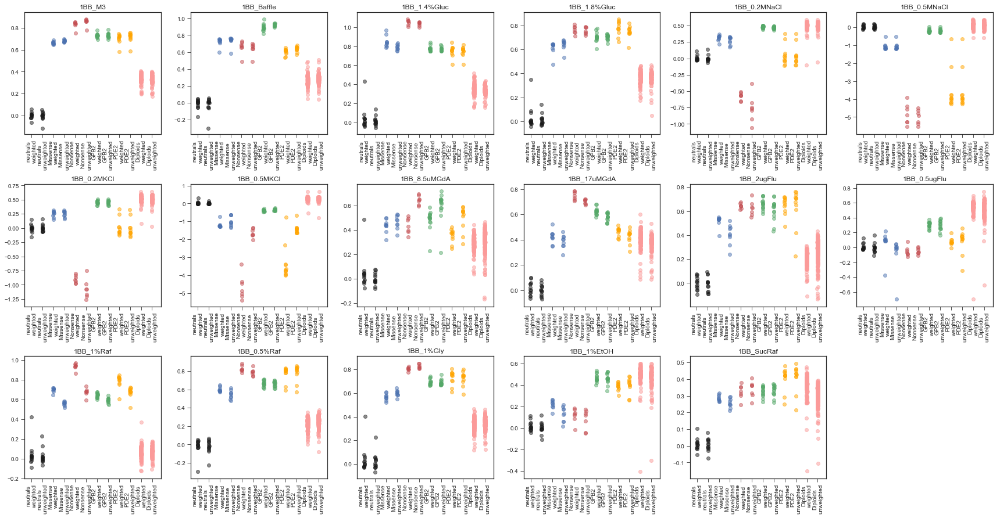

In [70]:
my_weighted_df = weight_comparision[True][bigbatch_columns].dropna()
my_unweighted_df = weight_comparision[False][bigbatch_columns].dropna()

n_samples = 100000
n_classes = len(classes)

plt.figure(figsize=(6*4,6*4))
for jj,condition in enumerate(list(bigbatch_conditions.keys())):
    plt.subplot(6,6,jj+1)
#     plt.figure()
    plt.title(condition)
    
    names = []
    
    for c,this_class in enumerate(classes):
        
        barcode_list = np.intersect1d(my_weighted_df[my_weighted_df['barcode'].isin(this_class)]['barcode'].values,
                                     my_unweighted_df[my_unweighted_df['barcode'].isin(this_class)]['barcode'].values)
        
        
        this_weight = my_weighted_df[my_weighted_df['barcode'].isin(barcode_list)][f'{condition}_fitness'].values
        this_unweight = my_unweighted_df[my_unweighted_df['barcode'].isin(barcode_list)][f'{condition}_fitness'].values


        plt.scatter([tools.jitter_point(c,0.01) for i in range(len(this_weight))],this_weight,color=class_colors[c],alpha=0.5)
        plt.scatter([tools.jitter_point(c+0.5,0.01) for i in range(len(this_unweight))],this_unweight,color=class_colors[c],alpha=0.5)
        
        names.append(f'{class_names[c]}\nweighted')
        names.append(f'{class_names[c]}\nunweighted')

    plt.xticks(np.arange(0,len(classes),0.5),names,rotation=90)
plt.tight_layout()       
plt.savefig('weighted_unweighted_1bigbatch_comparison.pdf',bbox_inches='tight')
    

In [26]:
these_times = ['P0','P1','P2','P3','P4']
timepoints = [0,1,2,3,4]
    
rep_times = {'P':data[these_times].values}
    
answer = atish.inferFitness(data['barcode'].values,timepoints,rep_times,
                                    neutralBarcodes=neutrals,lowCoverageThresh=cov_thresh,use_all_neutral=True,useMultNoise=True,weightedMean=True)



5
neutral reads 63424.0 75526.0
neutral reads 75526.0 34100.0
neutral reads 34100.0 5241.0
neutral reads 5241.0 5275.0
neutral reads 63424.0 75526.0
neutral reads 75526.0 34100.0
neutral reads 34100.0 5241.0
neutral reads 5241.0 5275.0
Multiplicative noise consistency checks

P  inconsistent times:

kappas [20.48771911 16.09384578 11.11302452  9.39738435]
multNoise [0.1 0.1 0.1 0.1]
No clear inconsistencies



/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: divide by zero encountered in power
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:226: RuntimeWarning: invalid value encountered in multiply
  zScores = zScores*np.power(expectedReads,-0.5)
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: divide by zero encountered in log
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_assay_grantedits.py:396: RuntimeWarning: invalid value encountered in subtract
  allTimeFitness = np.log(allReads[repName][:,1:]/totReads[1:])-np.log(allReads[repName][:,0:-1]/totReads[0:-1])
/Users/grantkinsler/Documents/Stanford/Research/TheoryPaper/code/fitness_a

In [64]:
def inverseVarAve(meanVals,standardDevs):
    """
    inverseVarAve - take weighted average with inverse variances.
    :param meanVals: Values to be averaged, N x q. Averaged across second dimension
    :param standardDevs: Standard errors of each value, N x q
    :return weightedMeans: N x 1 vector of weighted average
    :return weightedStandardDevs: N x 1 vector of final standard error
    """

    meanVals[meanVals == np.inf] = np.nan
    meanVals[meanVals == -np.inf] = np.nan
    standardDevs[standardDevs == np.inf]= np.nan
    standardDevs[standardDevs == -np.inf] = np.nan

    # weightedMeans = np.sum(meanVals*np.power(standardDevs,-2),axis=1)/np.sum(np.power(standardDevs,-2),axis=1)
    # weightedStandardDevs = np.power(np.sum(np.power(standardDevs,-2),axis=1),-0.5)

    weightedMeans = np.nansum(meanVals*np.power(standardDevs,-2),axis=1)/np.nansum(np.power(standardDevs,-2),axis=1)
    weightedStandardDevs = np.power(np.nansum(np.power(standardDevs,-2),axis=1),-0.5)

    return weightedMeans,weightedStandardDevs

def OLDinverseVarAve(meanVals,standardDevs):
    """
    inverseVarAve - take weighted average with inverse variances.
    :param meanVals: Values to be averaged, N x q. Averaged across second dimension
    :param standardDevs: Standard errors of each value, N x q
    :return weightedMeans: N x 1 vector of weighted average
    :return weightedStandardDevs: N x 1 vector of final standard error
    """

#     meanVals[meanVals == np.inf] = np.nan
#     meanVals[meanVals == -np.inf] = np.nan
#     standardDevs[standardDevs == np.inf]= np.nan
#     standardDevs[standardDevs == -np.inf] = np.nan

    weightedMeans = np.sum(meanVals*np.power(standardDevs,-2),axis=1)/np.sum(np.power(standardDevs,-2),axis=1)
    weightedStandardDevs = np.power(np.sum(np.power(standardDevs,-2),axis=1),-0.5)

#     weightedMeans = np.nansum(meanVals*np.power(standardDevs,-2),axis=1)/np.nansum(np.power(standardDevs,-2),axis=1)
#     weightedStandardDevs = np.power(np.nansum(np.power(standardDevs,-2),axis=1),-0.5)

    return weightedMeans,weightedStandardDevs


In [63]:
# answer['P']['allTimeFitness'][-10:,:]
inverseVarAve(answer['P']['allTimeFitness'][-10:,:],answer['P']['allTimeErrors'][-10:,:])

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in power


(array([-1.19464413, -5.40713792,         nan, -4.46802594, -5.16835191,
        -4.35434974, -3.39414997,         nan, -5.05004444, -4.88220097]),
 array([0.13822483, 0.64622315,        inf, 0.77113333, 0.72872606,
        0.85376886, 1.69794449,        inf, 1.2951709 , 0.563349  ]))

In [65]:
OLDinverseVarAve(answer['P']['allTimeFitness'][-10:,:],answer['P']['allTimeErrors'][-10:,:])

(array([-1.19464413,         nan,         nan,         nan,         nan,
                nan,         nan,         nan,         nan, -4.88220097]),
 array([0.13822483,        nan,        nan,        nan,        nan,
               nan,        nan,        nan,        nan, 0.563349  ]))

In [55]:
fitness_assay_grantedits.inverseVarAve(answer['P']['allTimeFitness'][-10:,:],answer['P']['allTimeErrors'][-10:,:])

NameError: name 'fitness_assay_grantedits' is not defined

In [38]:
np.where(data['barcode'].values,spike_in_nonsense)[0]

ValueError: either both or neither of x and y should be given

In [53]:
answer

{'P': {'allTimeErrors': array([[0.10873994, 0.11095647, 0.13926211, 0.12304796],
         [0.11785511, 0.2791174 , 0.50158498, 0.46291572],
         [0.11180215, 0.11478493, 0.14469975, 0.12758322],
         ...,
         [       inf,        inf,        inf,        inf],
         [1.3684005 , 4.01295973,        inf,        inf],
         [0.60781055, 2.00834794, 3.33511987, 3.06714596]]),
  'allTimeFitness': array([[ 0.2436911 ,  0.31720123,  0.10022823,  0.42870253],
         [-2.90815357, -2.30597649,  0.23336632, -0.00646636],
         [ 0.24818369,  0.31447962,  0.26571215,  0.3811234 ],
         ...,
         [        nan,         nan,         nan,         nan],
         [-5.45089228, -1.60271569,        -inf,         nan],
         [-5.52865223, -1.86157732,  0.4864907 , -0.00646636]]),
  'aveError': array([0.05940121, 0.10343284, 0.06141858, 0.0815201 , 0.07087879,
         0.21840273,        inf, 0.06263834, 0.49653483, 0.06100847,
                inf, 4.52744068, 0.0972586 , 0

In [30]:
allothersneutral = p.read_csv('../data/fitness_weighted_allconditions_swapsremoved_ALLOTHERSNEUTRAL.csv')
allothersneutral =allothersneutral
allothersneutral= allothersneutral.replace([np.inf, -np.inf], np.nan)
# this_data = this_data.dropna('columns',how='all')
allothersneutral = allothersneutral.dropna()
allothersneutral = allothersneutral.sort_values('barcode')

classicneutral = p.read_csv('../data/fitness_weighted_allconditions_swapsremoved.csv')
classicneutral = classicneutral
classicneutral= classicneutral.replace([np.inf, -np.inf], np.nan)
classicneutral = classicneutral.dropna()
classicneutral = classicneutral.sort_values('barcode')

In [31]:
allothersneutral

,barcode,gene,type,ploidy,class,additional_muts,1.4%-R1_error,1.4%-R1_fitness,1.4%-R2_error,1.4%-R2_fitness,...,1BB_1%Raf_fitness,1BB_1%Raf_error,1BB_0.5%Raf_fitness,1BB_0.5%Raf_error,1BB_1%Gly_fitness,1BB_1%Gly_error,1BB_1%EtOH_fitness,1BB_1%EtOH_error,1BB_SucRaf_fitness,1BB_SucRaf_error
0,53,Diploid,Diploid,Diploid,Diploid,TIP1-upstream_point_variant; YKR012C-upstream_...,0.096771,0.552197,0.202973,0.282028,...,0.044443,0.053122,0.254890,0.027405,0.329106,0.033011,0.478887,0.024701,0.327762,0.068335
1,151,IRA1,stop_gained,Haploid,PKA,SEH1-missense_variant; ZIP1-missense_variant; ...,0.037113,1.454943,0.040392,1.483416,...,0.977096,0.042767,0.983209,0.017637,1.013706,0.023387,0.662206,0.017346,0.567029,0.050582
2,262,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.071147,0.350150,0.157839,0.097254,...,-0.047782,0.060787,0.278725,0.029319,0.318723,0.034501,0.448399,0.027154,0.311350,0.071010
3,273,IRA1,frameshift_variant,Haploid,PKA,None,0.038835,0.850924,0.051190,0.790251,...,0.783116,0.042909,0.756663,0.018065,0.788614,0.024015,0.442463,0.019555,0.425647,0.052139
4,323,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.039474,0.975076,0.056151,0.781998,...,0.609776,0.043612,0.627666,0.019131,0.640382,0.025193,0.389036,0.022312,0.266725,0.056129
5,415,IRA1,frameshift_variant,Haploid,PKA,None,0.053515,0.924618,0.107780,0.618959,...,1.012810,0.042843,0.866498,0.017898,0.959765,0.024068,0.348310,0.022115,0.389045,0.051935
8,689,IRA1,frameshift_variant,Haploid,PKA,RPL19A-upstream_point_variant,0.049243,0.842817,0.089505,0.672065,...,1.077590,0.043050,0.968332,0.018592,1.071253,0.025645,0.642561,0.025300,0.480067,0.055471
9,697,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.089920,0.492778,0.205813,0.280118,...,0.070353,0.055935,0.213813,0.030039,0.276085,0.036135,0.444751,0.027296,0.294929,0.074699
12,1379,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.037407,1.159637,0.043449,1.146891,...,0.915739,0.042779,0.846849,0.017692,0.960686,0.023474,0.396336,0.018555,0.388745,0.051011
13,1488,NotSequenced,NotSequenced,NotSequenced,NotSequenced,NotSequenced,0.040660,0.887693,0.062433,0.822842,...,1.026990,0.042835,0.917667,0.017879,1.011038,0.024040,0.388246,0.021793,0.535707,0.051615


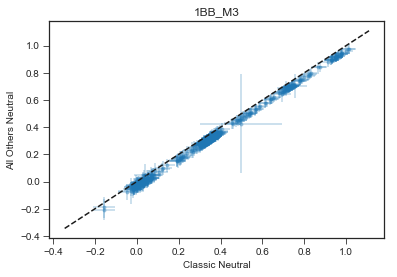

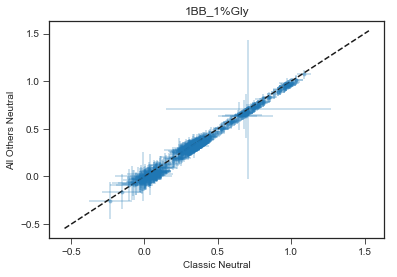

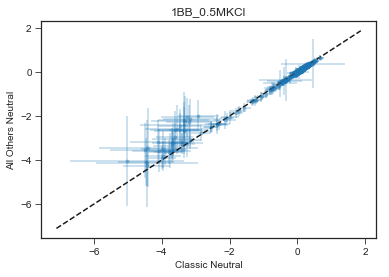

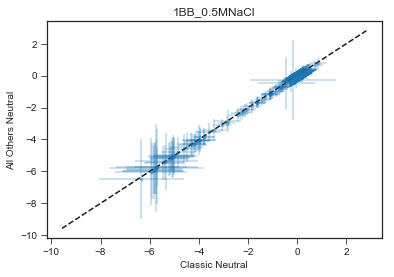

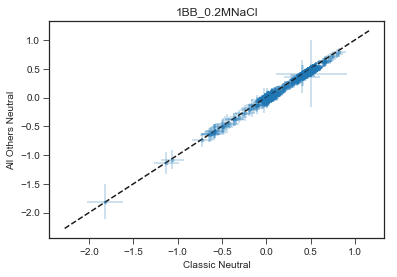

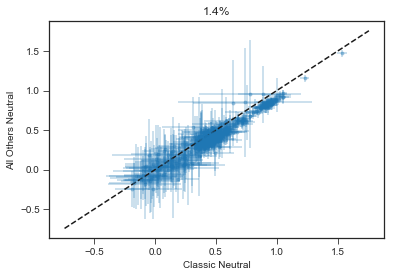

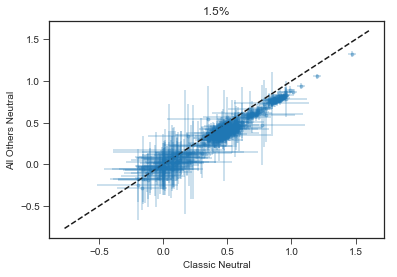

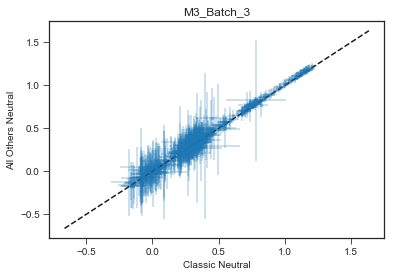

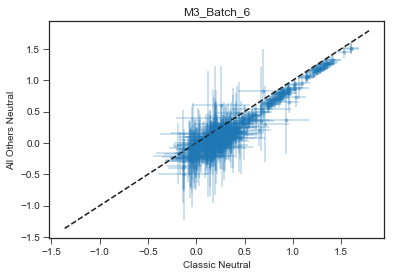

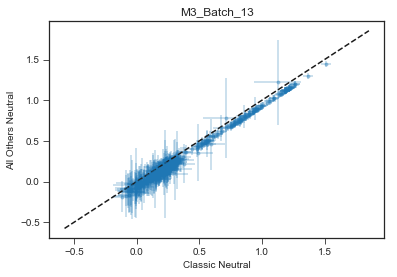

In [44]:
condition_list = ['1BB_M3','1BB_1%Gly','1BB_0.5MKCl','1BB_0.5MNaCl','1BB_0.2MNaCl',
                  '1.4%','1.5%','M3_Batch_3','M3_Batch_6','M3_Batch_13']

for condition in condition_list:
    plt.figure()
    plt.title(condition)
    plt.errorbar(classicneutral[f'{condition}_fitness'].values,allothersneutral[f'{condition}_fitness'].values,
             xerr=2*classicneutral[f'{condition}_error'].values,yerr=2*allothersneutral[f'{condition}_error'].values,
                 alpha=0.3,linestyle='',marker='.')
    ymin,ymax = plt.ylim()
    xmin,xmax = plt.xlim()
    plt.plot([min([xmin,ymin]),max([xmax,ymax])],[min([xmin,ymin]),max([xmax,ymax])],'k--')
    plt.xlabel('Classic Neutral')
    plt.ylabel('All Others Neutral')
# plt.scatter(classicneutral['1BB_M3_fitness'].values,allothersneutral['1BB_M3_fitness'].values)